In [39]:
# %%
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import seaborn as sns
import gzip

# For NLP processing
import re
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords, wordnet
from nltk.stem import WordNetLemmatizer
from nltk.sentiment import SentimentIntensityAnalyzer
from nltk.corpus import stopwords
from nltk import pos_tag
# Download necessary NLTK data
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
nltk.download('vader_lexicon')

# For topic modeling
from gensim import corpora, models

# For visualization of topics
from wordcloud import WordCloud

# For statistical analysis
from scipy.stats import (
    chi2_contingency, chi2, ttest_ind, mannwhitneyu,
    entropy, ks_2samp
)

# For embeddings and similarity calculations
from transformers import AutoTokenizer, AutoModel
import torch
from sklearn.manifold import TSNE
from scipy.spatial.distance import pdist
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Data loading
from src.data.beerdata_loader import BeerDataLoader

# To show progress
from tqdm import tqdm

#For multiprocessing
from multiprocessing import Pool

#For shapefiles
import geopandas as gpd

import os
import pickle

from gensim.models import LdaModel
from gensim.corpora import Dictionary

tqdm.pandas()
from collections import Counter
import plotly.express as px

import json

from src.data.helpers import *

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Qrnqult\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Qrnqult\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Qrnqult\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Qrnqult\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Qrnqult\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


<h1 style="font-size: 40px;">Step 1: Obtain main clusters</h1>

<span style="color:red">Beeradvocate, a renowned online beer rating platform, has entrusted us with building user communities to foster meaningful interactions. The goal is to create a space where users can share insights and experiences about the beers they try. The main challenge lies in connecting individuals with similar beer preferences, as users with diverse tastes often struggle to find like-minded people to engage with. Hence, our first goal is to find those comunities. To address this challenge, we successfully clustered a set of reviews from the platform, resulting in eight distinct clusters with sufficiently different characteristics. This segmentation allows us to better group users based on their beer preferences, facilitating more meaningful exchanges and personalized recommendations.</span>

<h1 style="font-size: 30px;">1.1: Determining clusters in beers using a graph</h1>

Here is the pipeline we designed to cluster the reviews effectively (only the results are shown here for brevity. For more details, please refer to the following folder : `src/scripts/graph_and_clustering`):

Our goal is to assign each beer a cluster

<h1 style="font-size: 25px;">1.1.1: Inverted Index from the reviews</h1>

After cleaning all the reviews by tokenizing them and removing the stop words, we create an inverted index to be able to search for a word and get the list of reviews containing this word. This will be useful for example to count the number of reviews containing a specific word. We first, only keep the 1000 most common words in the reviews.

In [ ]:
from collections import Counter
import pandas as pd

inverted_index = pd.read_csv('src/scripts/graph_and_clustering/merged_inverted_index.txt')

# print the 1000 most common words and their counts
word_counts = Counter()
for idx, row in inverted_index.iterrows():
    word_counts[row['word']] = sum([count for _, count in eval(row['postings'])])

In [ ]:
most_common_words = word_counts.most_common(1000)

print(most_common_words)

[('beer', 2220596), ('head', 1737581), ('nice', 1230717), ('light', 1193011), ('good', 1173115), ('malt', 1119044), ('taste', 1095313), ('like', 1062692), ('hops', 1034123), ('sweet', 1001603), ('one', 911828), ('bit', 908981), ('dark', 872351), ('carbonation', 836347), ('flavor', 834483), ('little', 790449), ('aroma', 728218), ('well', 720097), ('color', 706190), ('hop', 679369), ('bottle', 657165), ('body', 655391), ('finish', 645602), ('medium', 621703), ('really', 611427), ('white', 599014), ('pours', 588770), ('chocolate', 584013), ('caramel', 578749), ('brown', 567711), ('much', 550873), ('notes', 539000), ('glass', 536919), ('citrus', 531264), ('bitterness', 516161), ('lacing', 509567), ('poured', 508407), ('smell', 506962), ('great', 506009), ('alcohol', 494009), ('malts', 485108), ('bitter', 480969), ('would', 478336), ('nose', 475827), ('smooth', 466646), ('flavors', 463877), ('coffee', 460166), ('mouthfeel', 454217), ('sweetness', 438718), ('pretty', 430821), ('slightly', 42

<h1 style="font-size: 25px;">1.1.2: Automatically keeping only the most important words in the reviews</h1>

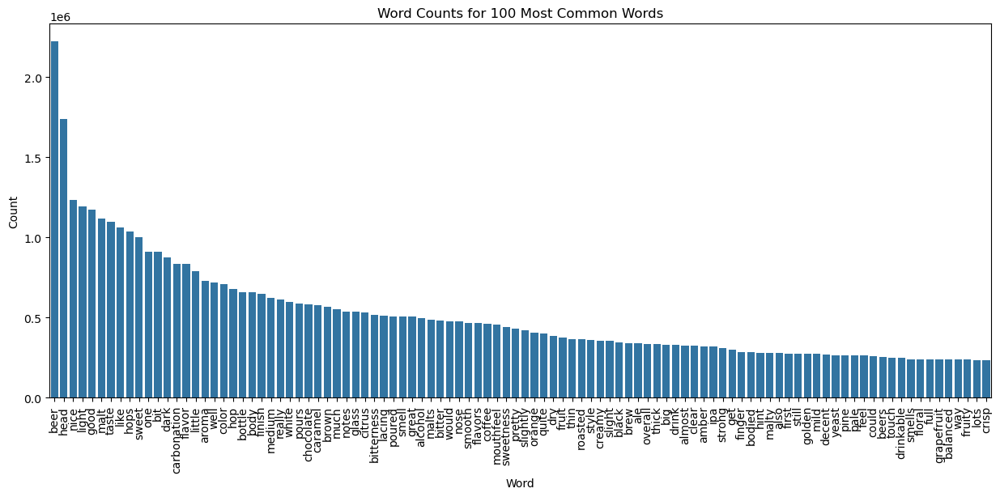

In [ ]:
# Bar plot of the counts of 100 most common words in the reviews

import matplotlib.pyplot as plt
import seaborn as sns
import pickle

with open('src/scripts/graph_and_clustering/word_counts.pkl', 'rb') as f:
    word_counts = pickle.load(f)

# Get the 100 most common words
most_common_words = word_counts.most_common(100)

# sort the words by count and plot a histogram with a bar for each word
plt.figure(figsize=(15, 6))
sns.barplot(x=[word for word, _ in most_common_words], y=[count for _, count in most_common_words])
plt.xticks(rotation=90)
plt.xlabel('Word')
plt.ylabel('Count')
plt.title('Word Counts for 100 Most Common Words')
plt.show()


We see on this graph that a lot of words have no real meaning in terms of beers. For example, it seems that the words "beer" or "would" will not be really useful to cluster our beers. We need to find a way to keep only the meaningful words for clustering.

<h1 style="font-size: 25px;">1.1.3: Construct a dataframe with number of time each word is used for each beer</h1>

In [ ]:
# rows : beers
# columns : words, and also the average and std ratings as well as the number of reviews

# sorted by the number of reviews for each beer

result_df = pd.read_csv('src/scripts/graph_and_clustering/beer_word_counts2.csv')

result_df

,beer_id,beer,head,nice,light,good,malt,taste,like,hops,...,average_aroma,std_aroma,average_palate,std_palate,average_taste,std_taste,average_overall,std_overall,average_rating,std_rating
0,28248,520,523,347,179,370,288,274,328,146,...,4.084175,0.411670,4.088805,0.487863,4.148990,0.440604,4.098906,0.457130,4.126885,0.392269
1,98394,5,5,0,2,0,3,3,7,3,...,3.805556,0.482726,3.833333,0.697217,3.722222,0.477907,3.666667,0.471405,3.776562,0.425937
2,54636,92,53,27,41,20,27,32,73,6,...,3.850000,0.727520,3.710714,0.798029,3.767857,0.825186,3.553571,0.751062,3.710727,0.692645
3,113063,3,4,2,0,1,4,3,3,4,...,4.125000,0.401819,3.791667,0.508606,3.791667,0.690963,3.750000,0.728869,3.919412,0.452541
4,28247,146,130,100,118,92,55,73,69,64,...,3.800898,0.426076,3.730539,0.479360,3.754491,0.487473,3.796407,0.531650,3.783826,0.395473
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
137828,187300,0,0,0,0,0,0,0,0,0,...,4.073529,0.400043,3.867647,0.748123,4.102941,0.477885,4.014706,0.590803,4.059412,0.465927
137829,239535,0,0,0,0,0,0,0,0,0,...,4.500000,0.000000,4.500000,0.000000,4.750000,0.000000,4.500000,0.000000,4.570000,0.000000
137830,196740,0,0,0,0,0,0,0,0,0,...,4.437500,0.369755,4.500000,0.530330,4.312500,0.480072,4.375000,0.450694,4.380000,0.439716
137831,131307,0,0,0,0,0,0,0,0,0,...,4.000000,0.204124,3.833333,0.117851,4.083333,0.311805,3.916667,0.117851,3.950000,0.268403


<h1 style="font-size: 25px;">1.1.4: Filtering out non discriminative words</h1>

As we can see, a lot of those words are not very informative about the type of beer. For example the word "beer" can be present in any review to the contrary of the word "citrus". To eliminate the non discriminative words, we use the Coefficient of Variation (CV) of the number of reviews containing a word. We keep only the words with the highest CV.

In [ ]:
# truncate result_df to only include beers with at least 500 reviews for better results on the calculation of the variance
result_df_trunc = result_df[result_df['total_ratings'] >= 500]
result_df_trunc = result_df_trunc.sort_values(by='total_ratings', ascending=False)
result_df_trunc[["beer_id","total_ratings"]]

,beer_id,total_ratings
4960,2093,3899
6300,11757,3811
469,412,3722
565,7971,3690
6280,1093,3561
...,...,...
4876,2270,503
2394,1053,502
3372,26541,502
5447,431,501


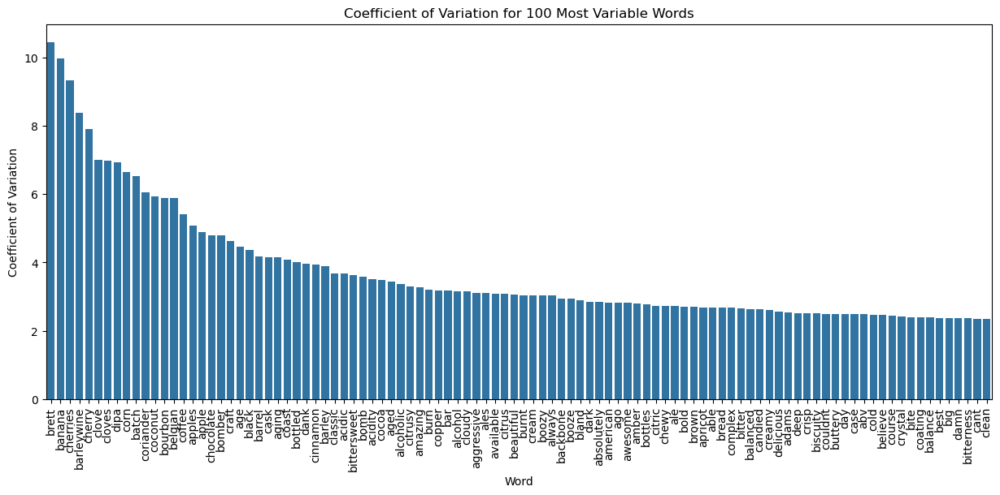

In [ ]:
most_common_words = word_counts.most_common(200)
most_common_words = np.array([word for word, _ in most_common_words])

word_means = result_df_trunc[most_common_words].mean()
word_stddevs = result_df_trunc[most_common_words].std()

# Step 2: Calculate the Coefficient of Variation (CV) for each word
coeff_of_variation = word_stddevs / word_means

# plot the variances in a bar plot in descending order (the 100 first)

plt.figure(figsize=(15, 6))
sns.barplot(x=coeff_of_variation.sort_values(ascending=False)[:100].index, y=coeff_of_variation.sort_values(ascending=False)[:100])
plt.xticks(rotation=90)
plt.xlabel('Word')
plt.ylabel('Coefficient of Variation')
plt.title('Coefficient of Variation for 100 Most Variable Words')
plt.show()

We notice that the discriminative words are better to find differences in beers than the words we found in the previous graph.

In [ ]:
coeff_of_variation = coeff_of_variation.sort_values(ascending=False)
selected_words = coeff_of_variation[:60]
print(selected_words)

brett          10.457062
banana          9.984142
cherries        9.345193
barleywine      8.387910
cherry          7.918100
clove           7.010899
cloves          6.979346
dipa            6.935523
corn            6.645406
batch           6.535108
coriander       6.043362
coconut         5.936976
bourbon         5.886504
belgian         5.877037
coffee          5.415063
apples          5.070264
apple           4.893924
chocolate       4.798396
bomber          4.782944
craft           4.622884
age             4.469809
black           4.359372
barrel          4.167107
cask            4.157023
aging           4.153372
coast           4.081843
bottled         4.006752
dank            3.951302
cinnamon        3.928551
barley          3.887305
classic         3.675843
acidic          3.673898
bittersweet     3.631472
bomb            3.576457
acidity         3.517735
cocoa           3.486417
aged            3.436988
alcoholic       3.362223
citrusy         3.293088
amazing         3.267486


<h1 style="font-size: 25px;">1.1.5: Computing the similarity matrix</h1>

We use the cosine similarity metric to compute the similarity between the beers. We then use the similarity matrix to create a graph where the nodes are the beers and the edges are the similarity between the beers.

In [ ]:
cosine_sim_df = pd.read_csv('src/scripts/graph_and_clustering/cosine_similarity.csv', index_col=0)
with open('src/scripts/graph_and_clustering/beer_name_dict.pkl', 'rb') as f:
    beer_name_dict = pickle.load(f)

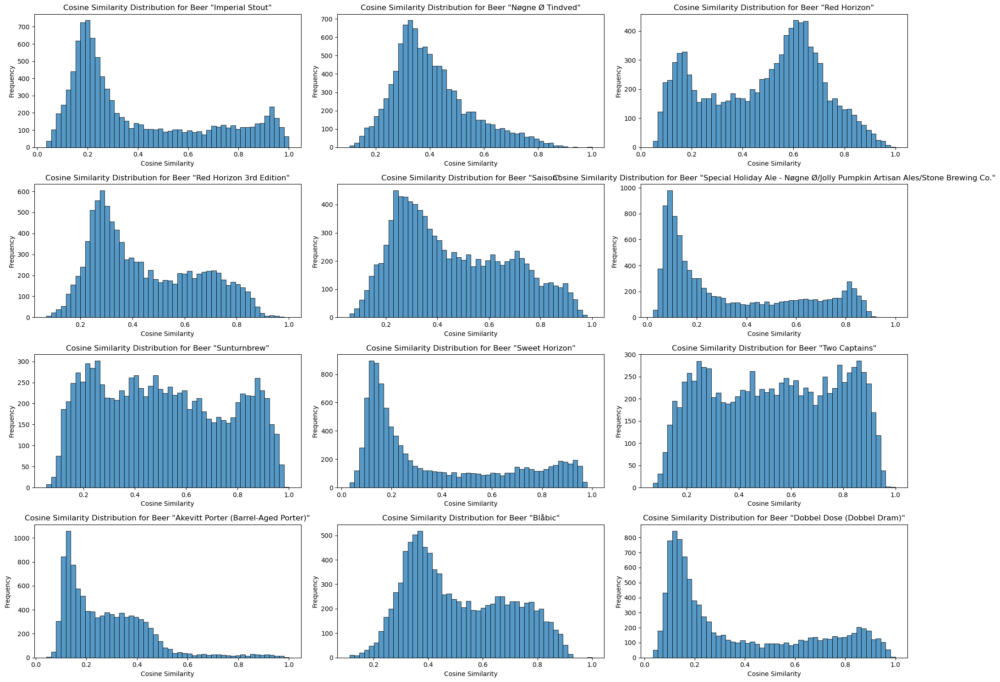

In [ ]:
# plot a histogram of the cosine similarities for the 10 first beers
fig, axes = plt.subplots(4, 3, figsize=(20, 15))
axes = axes.flatten()

for i in range(12):
    beer_name = beer_name_dict[result_df.iloc[i]['beer_id']]
    sns.histplot(cosine_sim_df.iloc[i].values, bins=50, ax=axes[i])
    axes[i].set_title(f'Cosine Similarity Distribution for Beer "{beer_name}"')
    axes[i].set_xlabel('Cosine Similarity')
    axes[i].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

We see here that we are able to find differences in the beers. It's a really promising result if we want to cluster our beers.

<h1 style="font-size: 25px;">1.1.6: Constructing the graph and clustering</h1>

To construct the graph, we use the similarity matrix and the igraph library. The nodes are the beers and the edges are the similarity between the beers. We only keep the edges with a similarity bigger than 0.7 for computation issues. We then use the Louvain algorithm to cluster the graph.

This part is very computationally and memory expensive. We had to optimize the code to a maximum, use mpi4py to parallelize the code, perform computations in batches to avoid memory issues and use the igraph library which is very efficient for this kind of computation. Moreover, we executed the code on an HPC cluster. The most time consuming part is the visualization of the graph, which required us to use 2 "Intel Xeon Gold 6230
20C @ 2.1GHz" processors with 1.5TB of memory and 80 cores each.

The code is available in the following folder : `src/scripts/graph_and_clustering` (see the README.md in that folder for more details)

In [ ]:
# clusters that were found using Louvain clustering

import json
with open('src/scripts/graph_and_clustering/outputs/partition.json', 'r') as f:
    partition = json.load(f)

In [ ]:
# number of clusters
n_clusters = len(set(partition.values()))
print(f'Number of clusters: {n_clusters}')

Number of clusters: 20


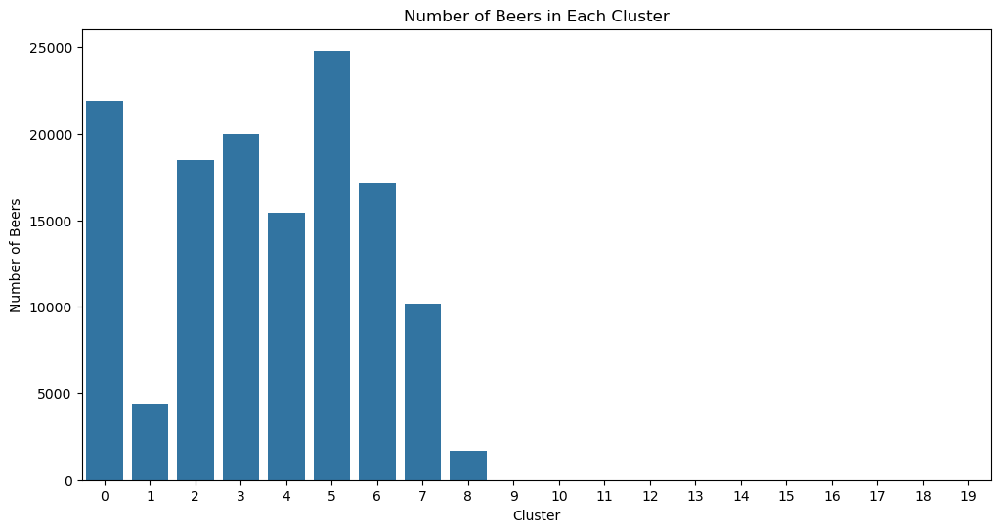

In [ ]:
# number of beers in each cluster
cluster_sizes = Counter(partition.values())

plt.figure(figsize=(12, 6))
sns.barplot(x=list(cluster_sizes.keys()), y=list(cluster_sizes.values()))
plt.xlabel('Cluster')
plt.ylabel('Number of Beers')
plt.title('Number of Beers in Each Cluster')
plt.show()

# Only 9 clusters are real clusters. The others are due to isolated nodes from the main graph.

We notice that cluster 1 and 8 contain less beers than the others. As we will see later, they correspond to very special beers that are not as popular as the others. 

In the following cell, we extract the top beers for each cluster. 

In [ ]:
# get the top rated beers in each cluster
result_df['beer_id'] = result_df['beer_id'].astype(str)
result_df['cluster'] = result_df['beer_id'].map(partition)
result_df['beer_id'] = result_df['beer_id'].astype(int)

cluster_to_top_5_beers_dict = {}

for cluster in range(9):
    cluster_df = result_df[result_df['cluster'] == cluster]
    top_5_beers = cluster_df.sort_values('total_ratings', ascending=False).head(5)
    cluster_to_top_5_beers_dict[cluster] = top_5_beers

# print the top 5 beers in each cluster
for cluster, top_5_beers in cluster_to_top_5_beers_dict.items():
    print(f'Cluster {cluster}:')
    for idx, row in top_5_beers.iterrows():
        beer_name = beer_name_dict[row['beer_id']]
        print(f'\t{beer_name} - {row["total_ratings"]} reviews')
    print()

Cluster 0:
	Prima Pils - 2105.0 reviews
	Pabst Blue Ribbon (PBR) - 1724.0 reviews
	#9 - 1703.0 reviews
	Budweiser - 1683.0 reviews
	Sierra Nevada Summerfest - 1605.0 reviews

Cluster 1:
	Founders KBS (Kentucky Breakfast Stout) - 2180.0 reviews
	Founders Backwoods Bastard - 1842.0 reviews
	Crème Brûlée Imperial Milk Stout (Blackwater Series) - 1466.0 reviews
	Vanilla Porter - 1088.0 reviews
	Insanity (Ale Aged in Oak Barrels) - 947.0 reviews

Cluster 2:
	90 Minute IPA - 3899.0 reviews
	Pliny The Elder - 3690.0 reviews
	Two Hearted Ale - 3561.0 reviews
	Hopslam Ale - 3527.0 reviews
	Sierra Nevada Celebration Ale - 3466.0 reviews

Cluster 3:
	Founders Breakfast Stout - 3811.0 reviews
	Old Rasputin Russian Imperial Stout - 3722.0 reviews
	Brooklyn Black Chocolate Stout - 2810.0 reviews
	Stone Imperial Russian Stout - 2754.0 reviews
	Storm King Stout - 2642.0 reviews

Cluster 4:
	La Fin Du Monde - 2976.0 reviews
	Weihenstephaner Hefeweissbier - 2530.0 reviews
	Hennepin (Farmhouse Saison) - 

We plan to have a better understanding of the clusters in the future, by looking at the most common words in each cluster and the most important beers. This will allow us to have a better understanding of the different types of beers and their characteristics and ultimately link this to out study of the IPA beers.

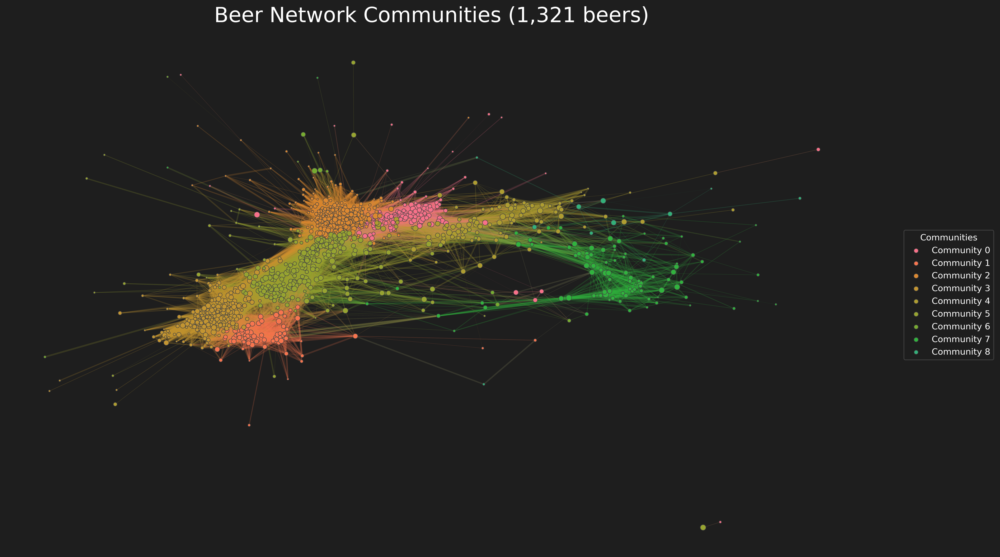

In [ ]:
# Visualization of the graph with the 1% most rated beers

from IPython.display import Image
Image(filename='src/scripts/graph_and_clustering/beer_network_0.01.png')


<h1 style="font-size: 30px;">1.2 Beer characteristics of each cluster</h1>

<h1 style="font-size: 25px;">1.2.1: Constructing the graph and clustering</h1>

In this part we simply load the all the data we need for the rest of our analysis

In [6]:
with open('src/data/beer_name_dict.pkl', 'rb') as f:
    beer_name_dict = pickle.load(f)

In [7]:
data_loader = BeerDataLoader(data_dir="../ada-2024-project-data-crusadas/src/data/BeerAdvocate", force_process=False)

ba_reviews_df, ba_ratings_df, ba_beers_df, ba_breweries_df, ba_users_df = data_loader.load_all_data()

Processed file '../ada-2024-project-data-crusadas/src/data/BeerAdvocate\reviews_processed.csv' already exists. Skipping processing.
Processed file '../ada-2024-project-data-crusadas/src/data/BeerAdvocate\ratings_processed.csv' already exists. Skipping processing.


In [ ]:
interesting_rating = ba_ratings_df[['beer_id', 'appearance', 'aroma', 'palate', 'taste', 'rating']]
mean_ratings = interesting_rating.groupby('beer_id').mean().reset_index()
merged_df_beers = pd.merge(ba_beers_df, mean_ratings, on='beer_id', how='right')

In [11]:
assigned_cluster = pd.merge(result_df[['beer_id', 'cluster']], merged_df_beers, on='beer_id', how='inner')

The following cell correspond to the list of descriptors we use to extract the main characteristics of each cluster.

In [ ]:
flavor_descriptors = [
    'hoppy', 'bitter', 'citrus', 'pine', 'floral', 'malty', 'sweet', 'roasted', 'caramel',
    'chocolate', 'coffee', 'fruit', 'spicy', 'herbal', 'earthy', 'toffee', 'tropical', 'yeast',
    'banana', 'clove', 'smoke', 'oak', 'vanilla', 'nutty', 'wheat', 'grain', 'sour', 'tart', 'milk', 'coriander'
]
appearance_descriptors = [
    'head', 'dark', 'brown', 'light', 'white', 'golden', 'straw', 'orange', 'yellow', 'pale', 'hazy', 'opaque', 'amber'
]

In the following cell we load the images we asked Dall-E to create for us. We gave ChatGPT as input the top 5 beer styles for each cluster and he gave us the corresponding clusters names. We then used those names to create the images. Here is the names ChatGPT gave for each cluster: 

In [ ]:
cluster_mapping = {
    0: 'Light and Refreshing Lagers',
    1: 'Dark and Strong Ales',
    2: 'Hop-Forward IPAs',
    3: 'Rich and Roasty Stouts',
    4: 'Belgian and Wheat Styles',
    5: 'Malty and Balanced Ales',
    6: 'Citrusy and Balanced IPAs',
    7: 'Sour and Experimental Beers',
    8: 'Specialty and Niche Styles'
}

In [ ]:
# Path to the image file
image_path = "./src/data/beer_images/"
all_files = [f for f in os.listdir(image_path) if os.path.isfile(os.path.join(image_path, f))]

./src/data/beer_images/C0_LightAndRefreshingLagers.png


<h1 style="font-size: 25px;">1.2.2: Showing characteristics of each cluster</h1>

<span style="color:red">
With our clusters established, Beeradvocate requested a detailed characterization of each one. Specifically, they want:


1. Main Beer Styles: Identifying the dominant beer styles in each cluster.

2. Key Appearance and Flavor Features: Highlighting defining traits such as color, bitterness, sweetness, or aroma.

These characteristics will help users find communities that align with their preferences. For example, an American Stout enthusiast might be curious about the distinct flavors that define this style, such as coffee and chocolate notes with dark/black color. They may also want to discover other beer styles with similar profiles, enhancing their exploration and engagement within the platform.
</span>

In [31]:
#We decide to let this function available in the main notebook, 
#as we thought that is was essential to understand how we exctracted those main features
def extract_features(cluster_reviews_df, other_reviews_df):
    #Filter our subsets and balance
    cluster_reviews_filtered, other_reviews_filtered = filter_beer_reviews(cluster_reviews_df, other_reviews_df)
    #Tokenize
    cluster_reviews_filtered, other_reviews_filtered = tokenize(cluster_reviews_filtered, other_reviews_filtered)
    #Extract top words
    cluster_top_words, other_top_words = extract_top_words(cluster_reviews_filtered, other_reviews_filtered)

    #Check what appearance terms our cluster correspond to
    appearance_comparison_df = compute_criterium(cluster_top_words, other_top_words, appearance_descriptors)

    ##Check what taste terms our cluster correspond to
    flavor_comparison_df = compute_criterium(cluster_top_words, other_top_words, flavor_descriptors)

    return appearance_comparison_df, flavor_comparison_df

Cluster 0


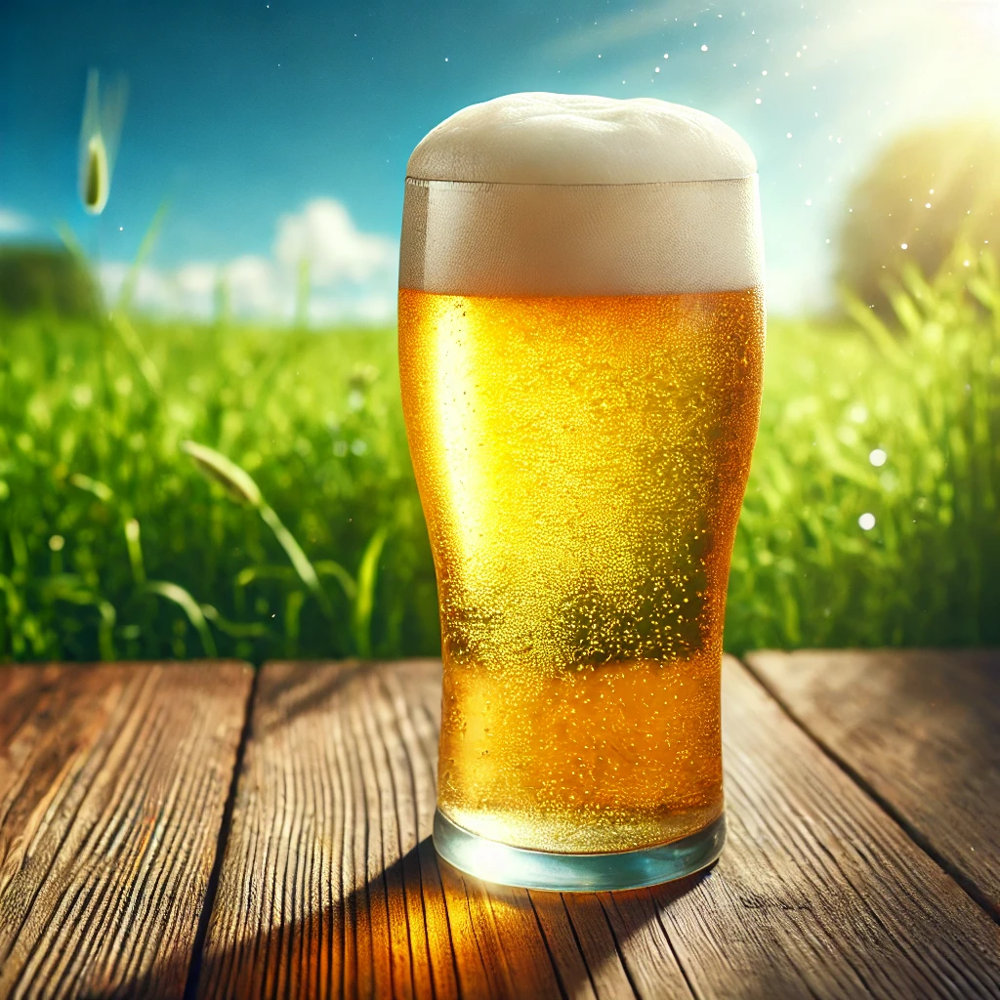

Total number of selected IPA reviews: 100000
Total number of selected Non-IPA reviews: 100000


100%|██████████| 100000/100000 [01:26<00:00, 1159.08it/s]


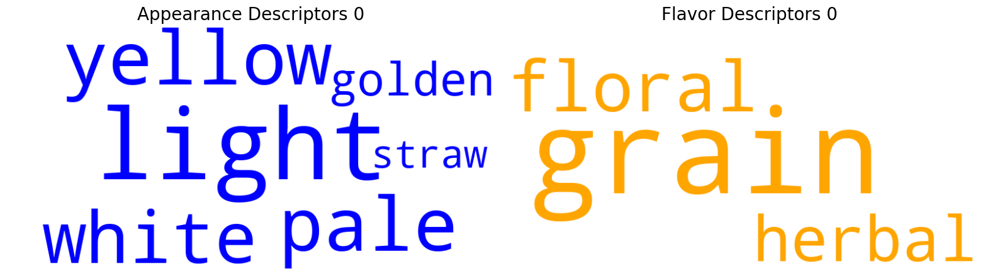

Cluster 1


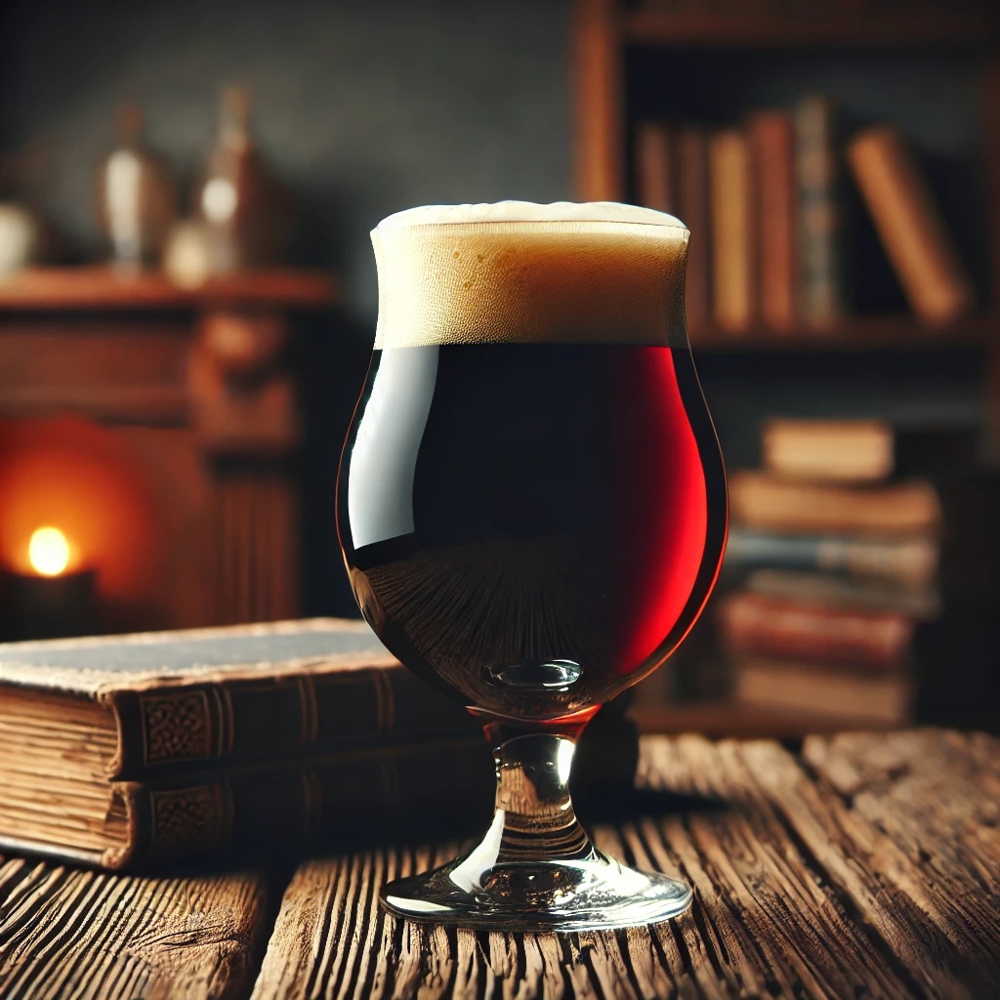

Total number of selected IPA reviews: 59467
Total number of selected Non-IPA reviews: 59467


100%|██████████| 59467/59467 [00:48<00:00, 1222.63it/s]


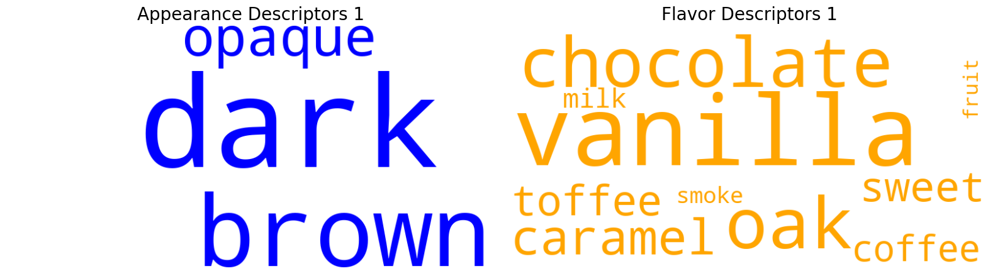

Cluster 2


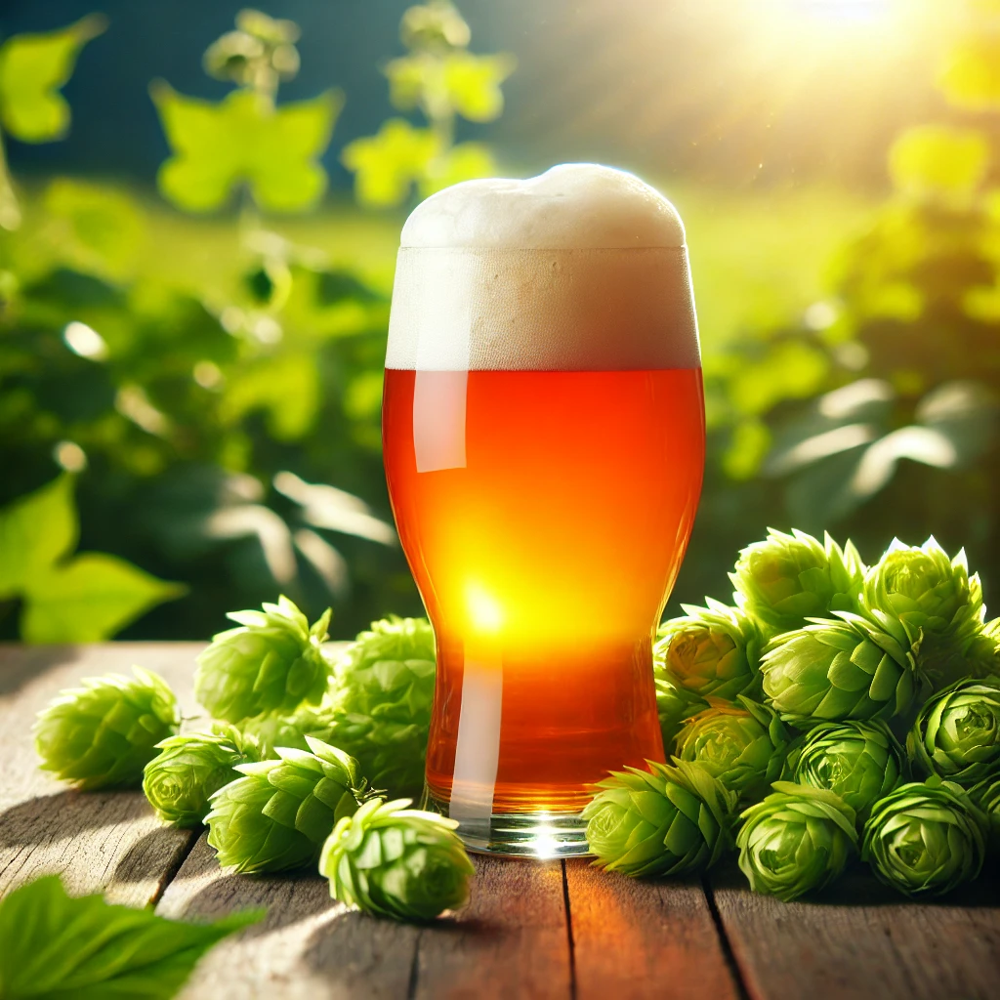

Total number of selected IPA reviews: 100000
Total number of selected Non-IPA reviews: 100000


100%|██████████| 100000/100000 [01:34<00:00, 1059.13it/s]


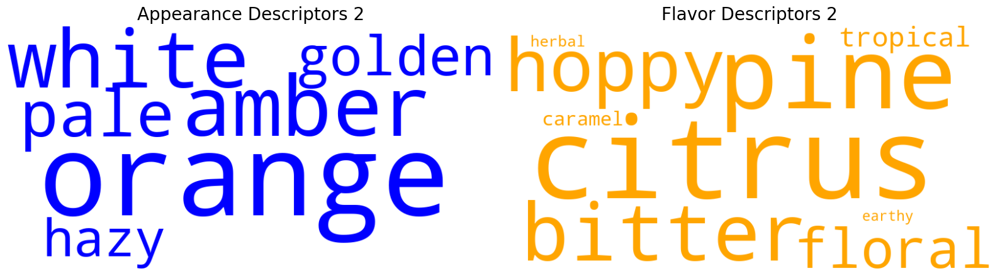

Cluster 3


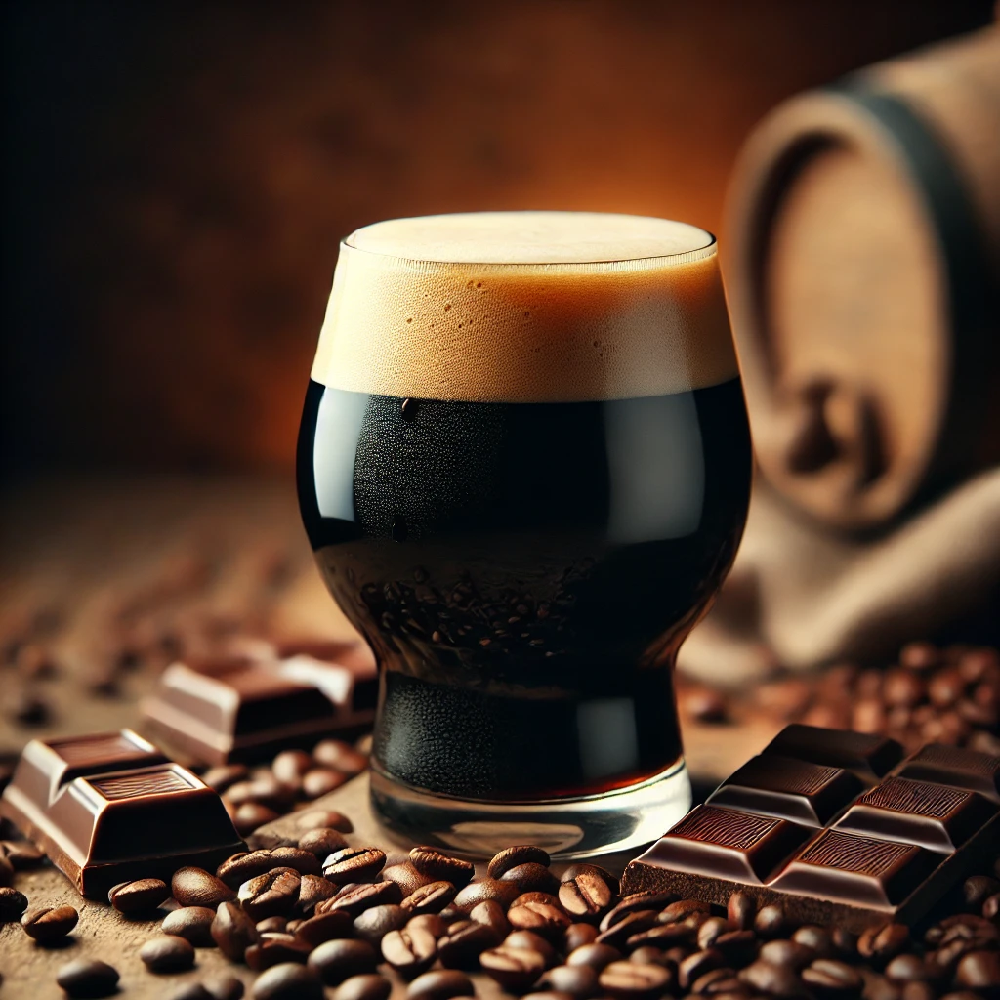

Total number of selected IPA reviews: 100000
Total number of selected Non-IPA reviews: 100000


100%|██████████| 100000/100000 [01:19<00:00, 1259.63it/s]


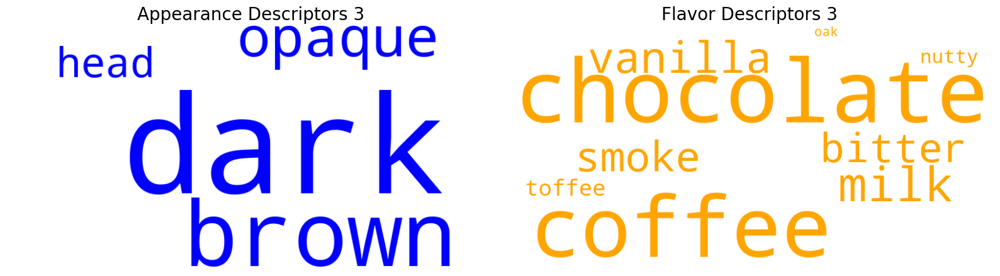

Cluster 4


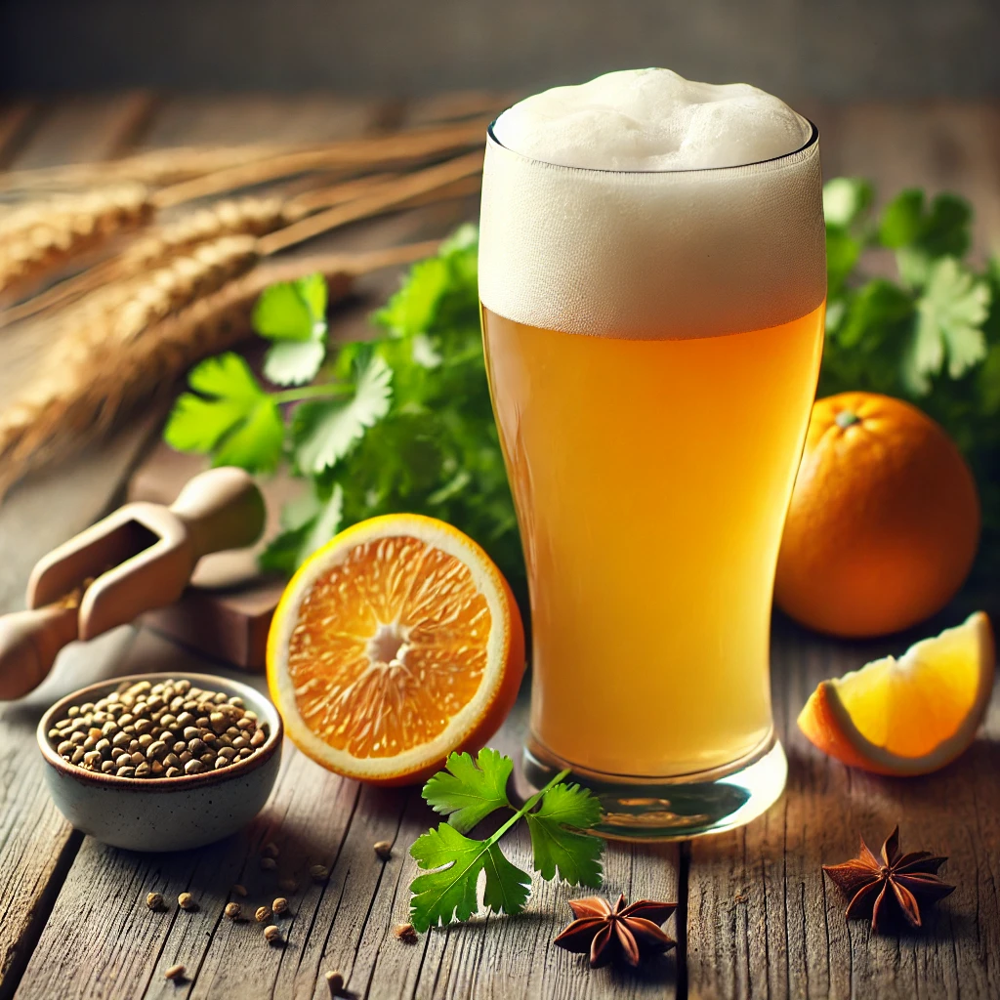

Total number of selected IPA reviews: 100000
Total number of selected Non-IPA reviews: 100000


100%|██████████| 100000/100000 [02:09<00:00, 769.64it/s]


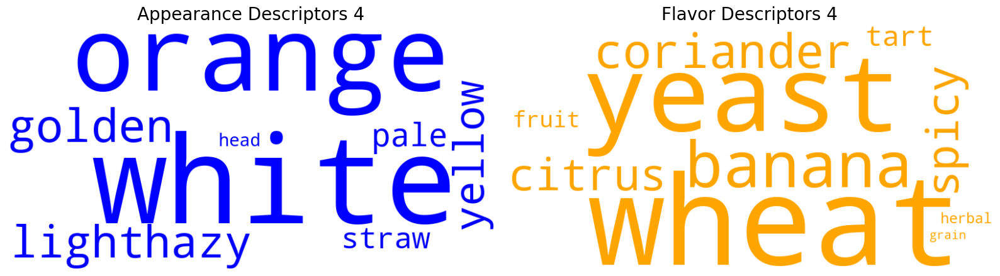

Cluster 5


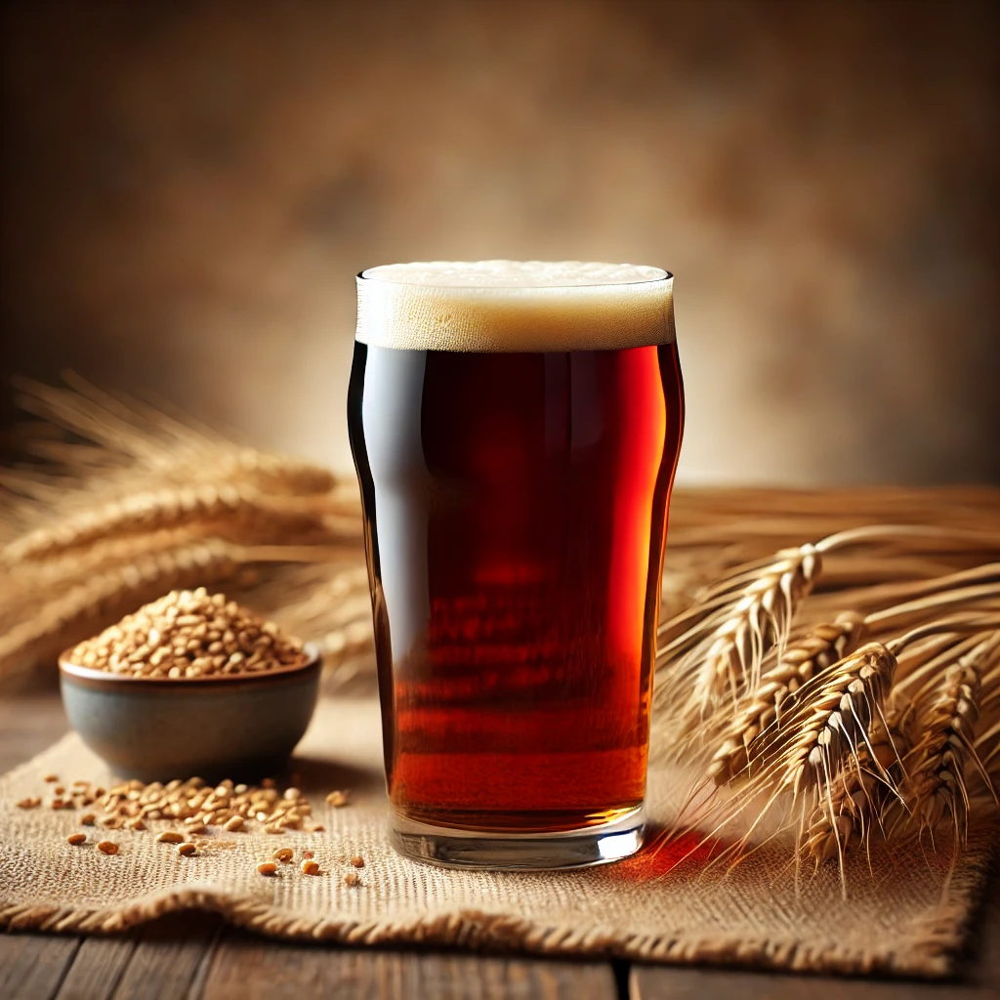

Total number of selected IPA reviews: 100000
Total number of selected Non-IPA reviews: 100000


100%|██████████| 100000/100000 [01:25<00:00, 1170.29it/s]


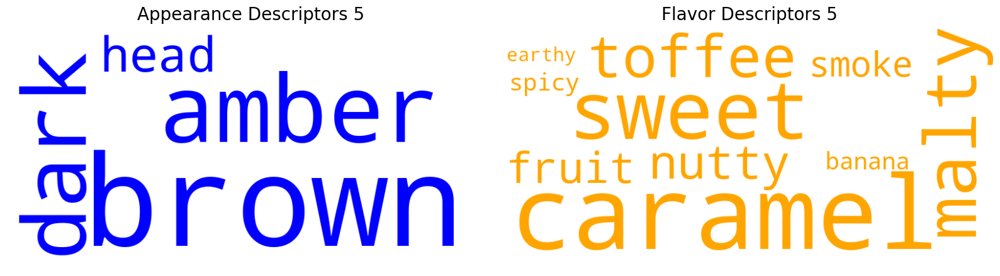

Cluster 6


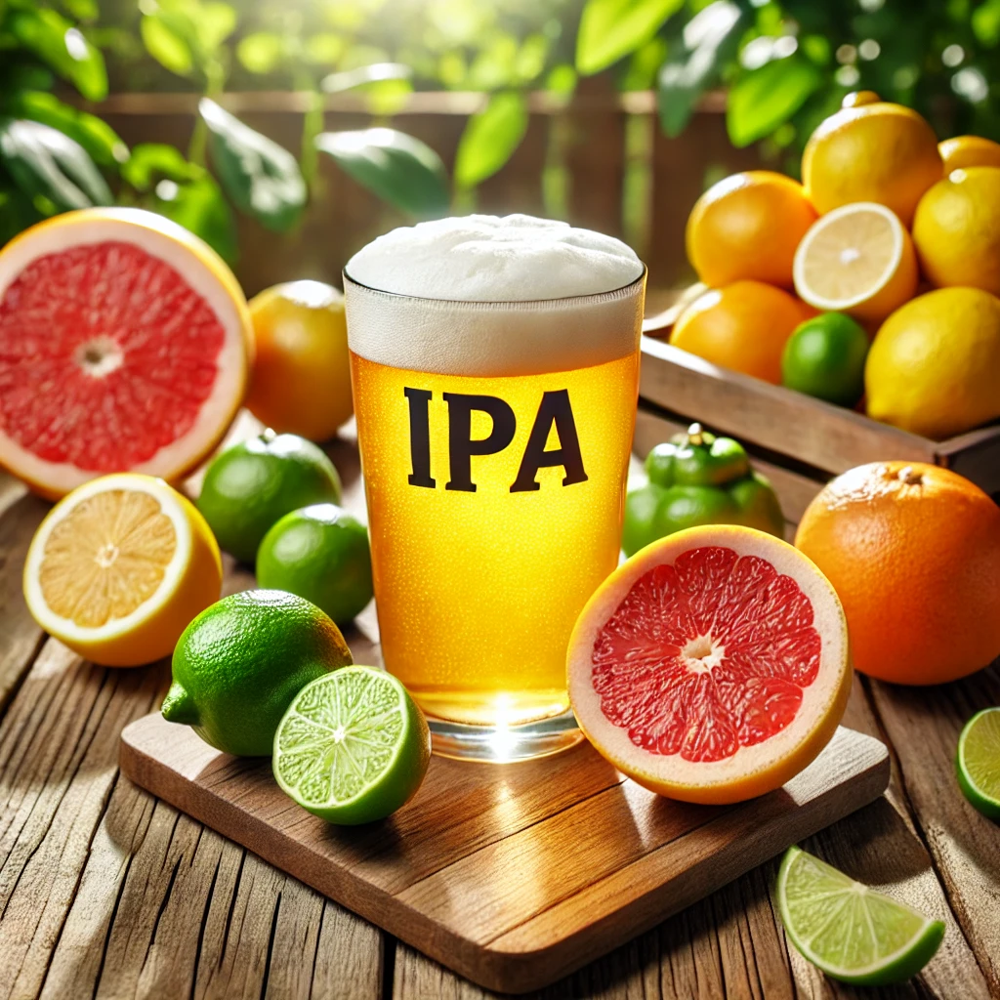

Total number of selected IPA reviews: 23920
Total number of selected Non-IPA reviews: 23920


100%|██████████| 23920/23920 [00:22<00:00, 1049.33it/s]


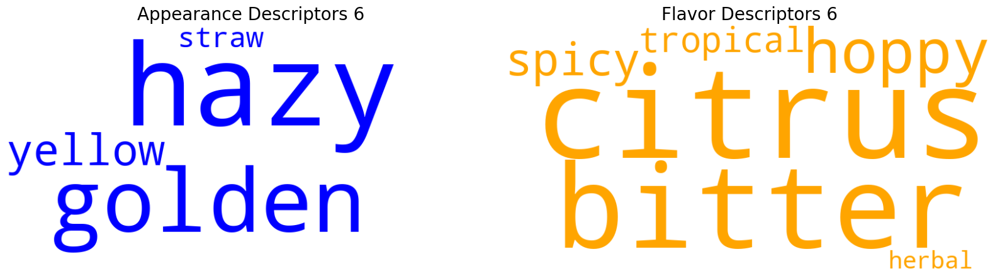

Cluster 7


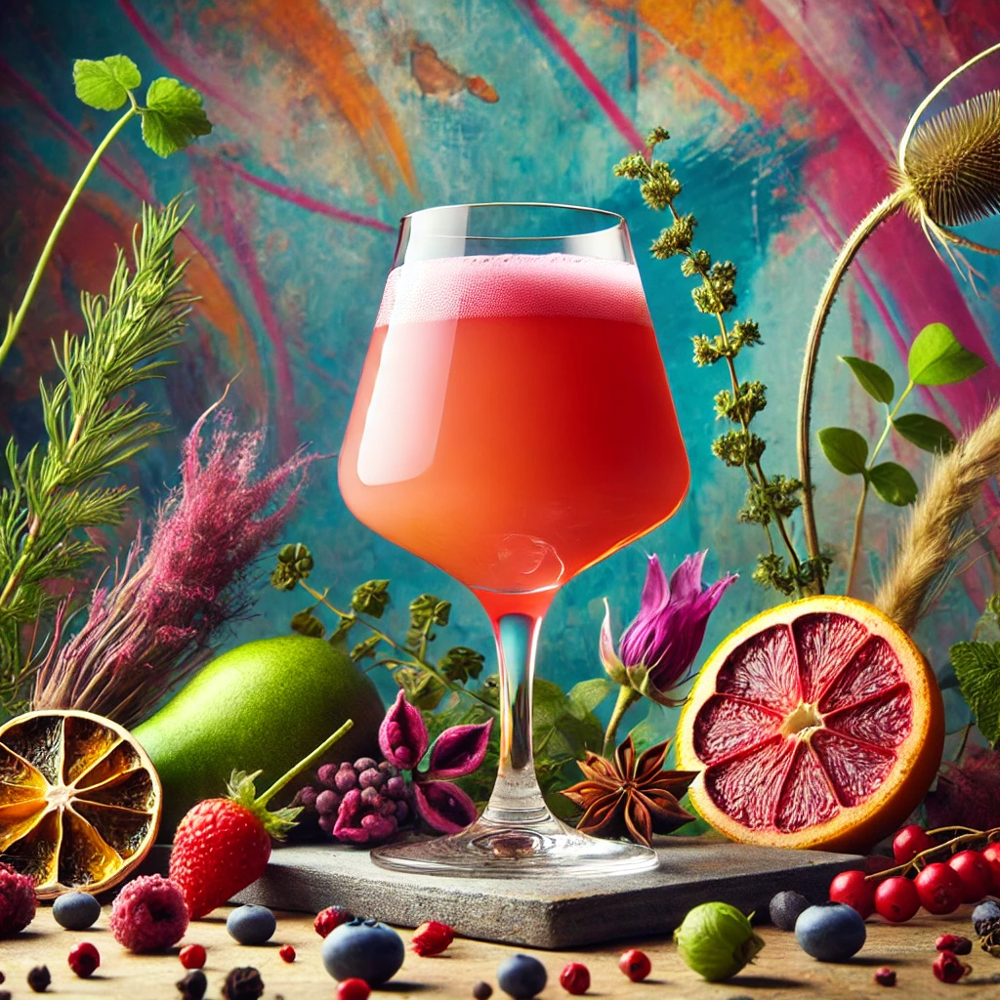

Total number of selected IPA reviews: 70430
Total number of selected Non-IPA reviews: 70430


100%|██████████| 70430/70430 [01:00<00:00, 1159.63it/s]


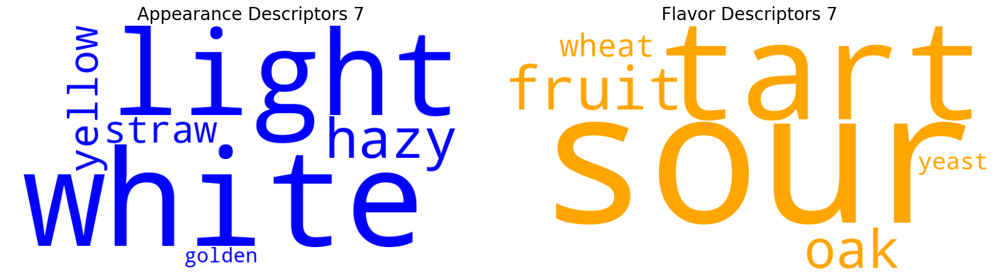

Cluster 8


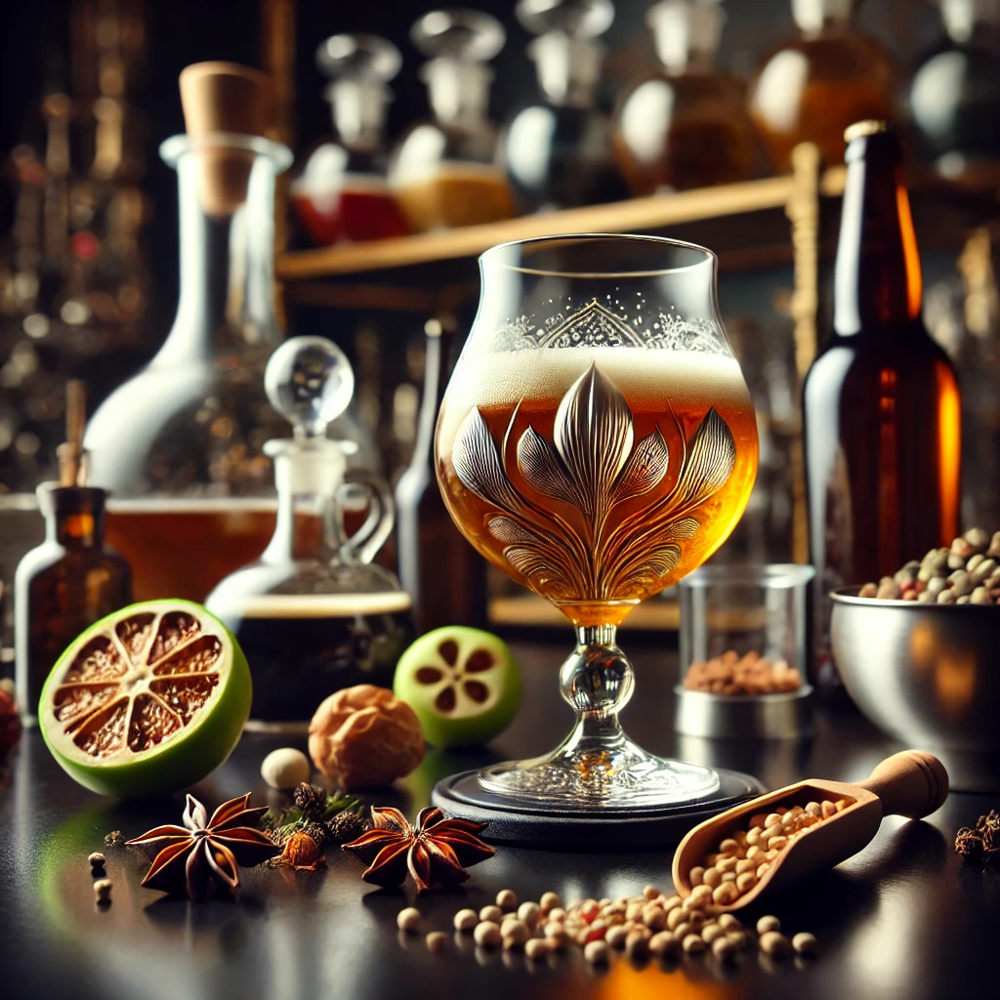

Total number of selected IPA reviews: 15188
Total number of selected Non-IPA reviews: 15188


100%|██████████| 15188/15188 [00:12<00:00, 1181.78it/s]


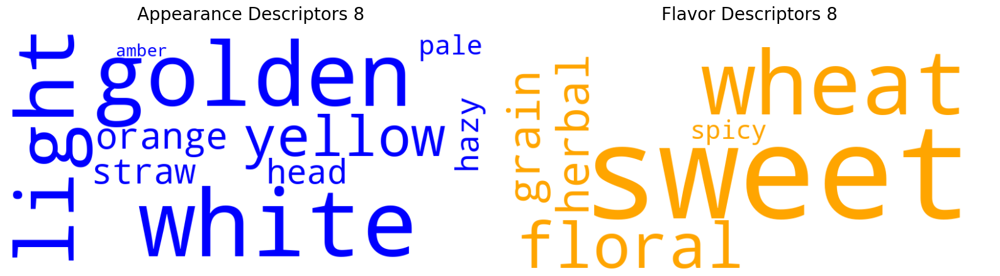

In [ ]:
for i in range(0,9):
    
    print(f"Cluster {i}")

    #Display beer images (created with Dall-e): 
    display(Image(filename=image_path + all_files[i]))

    #Create "camembert" with top beers for our cluster
    create_sunburst(i, assigned_cluster, f'Cluster {i}', 'darkred')

    #Seperate reviews from the specific cluster from other clusters
    cluster_number = i
    cluster_reviews_df = ba_reviews_df[ba_reviews_df['beer_id'].isin(assigned_cluster[assigned_cluster['cluster'] == cluster_number]['beer_id'])].copy()
    cluster_reviews_df.reset_index(drop=True, inplace=True)
    other_reviews_df = ba_reviews_df[~ba_reviews_df['beer_id'].isin(assigned_cluster[assigned_cluster['cluster'] == cluster_number]['beer_id'])].copy()
    other_reviews_df.reset_index(drop=True, inplace=True)

    #Extract the the coefficient for appearance and flavors features for our cluster
    appearance_comparison_df, flavor_comparison_df = extract_features(cluster_reviews_df, other_reviews_df)

    #Obtain the features that are positively corralated with our cluster
    top_appearance = appearance_comparison_df[appearance_comparison_df['Difference'] > 0]
    top_flavor = flavor_comparison_df[flavor_comparison_df['Difference'] > 0]

    print_cloud(top_appearance, top_flavor, i)
    

We observed that a quick review of the top styles and word descriptors within each cluster yields strong, sensible results. For instance, Cluster 3 (named "Rich and Roasty Stouts" by ChatGPT) features American Porter, Imperial Stout, and American Stout as the main styles, with appearance descriptors like dark, brown, and opaque, and flavor notes of chocolate and coffee. This aligns perfectly with our expectations and provides valuable insights, leaving us confident in the accuracy and usefulness of the results.

<h1 style="font-size: 25px;">1.2.3: Link between cluster 2 and IPAs</h1>

<span style="color:red">In our project group, we are all IPA enthusiasts. Initially, our goal was to extract key features of IPA beers and analyze their evolution over time, as well as their geographical distribution. After successfully clustering the reviews, we discovered that one of our clusters closely resembles an "IPA cluster." In the following section, we will highlight this insight by comparing the key appearance and flavor descriptors of IPA beers with those of our second cluster. This provides further evidence of how effectively our clustering approach works. The close alignment between the IPA beers and one of our clusters reinforces the accuracy and relevance of our method in identifying distinct beer styles and preferences.</span>    

Total number of selected IPA reviews: 100000
Total number of selected Non-IPA reviews: 100000


100%|██████████| 100000/100000 [01:11<00:00, 1403.57it/s]
C:\Users\Qrnqult\AppData\Local\Temp\ipykernel_26360\304123470.py:16: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




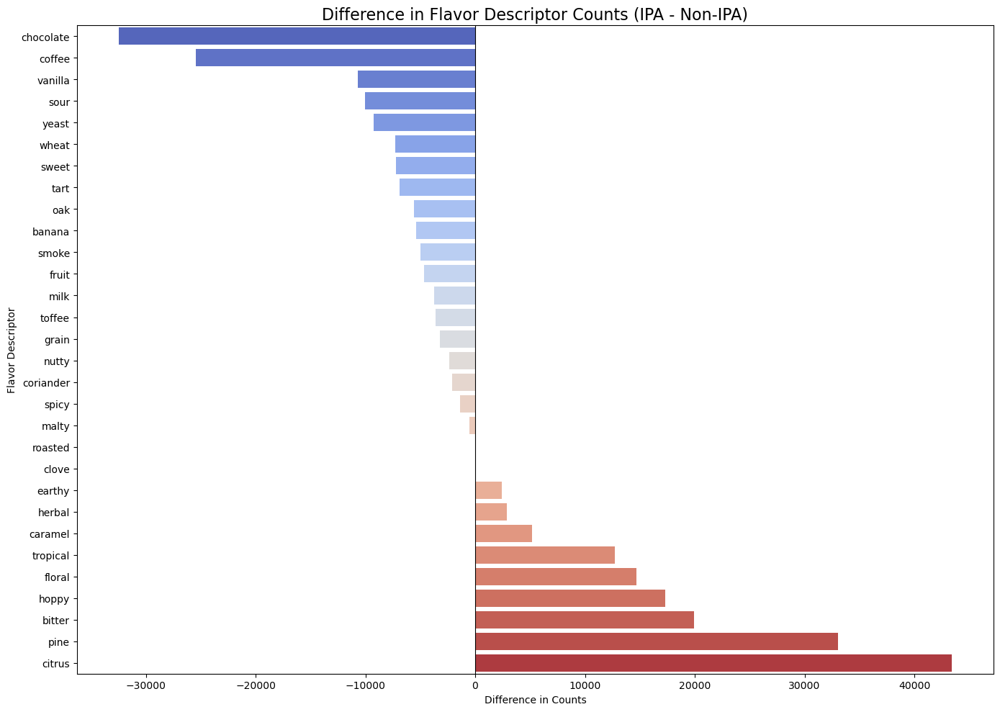

In [32]:
cluster_number = 2

#Extract cluster 2 beers and other beers
cluster_reviews_df = ba_reviews_df[ba_reviews_df['beer_id'].isin(assigned_cluster[assigned_cluster['cluster'] == cluster_number]['beer_id'])].copy()
cluster_reviews_df.reset_index(drop=True, inplace=True)
other_reviews_df = ba_reviews_df[~ba_reviews_df['beer_id'].isin(assigned_cluster[assigned_cluster['cluster'] == cluster_number]['beer_id'])].copy()
other_reviews_df.reset_index(drop=True, inplace=True)

_ , flavor_comparison_df = extract_features(cluster_reviews_df, other_reviews_df)

# Sort by absolute difference
sorted_flavors = flavor_comparison_df.sort_values('Difference', ascending=True)

# Plot difference bar chart
plt.figure(figsize=(14, 10))
sns.barplot(
    data=sorted_flavors,
    x='Difference',
    y='Appear',
    palette='coolwarm',
    orient='h'
)
plt.title('Difference in Flavor Descriptor Counts (IPA - Non-IPA)', size=16)
plt.xlabel('Difference in Counts')
plt.ylabel('Flavor Descriptor')
plt.axvline(0, color='black', linewidth=0.8)
plt.tight_layout()
plt.show()


In [ ]:
#Macro group correspond to the styles beeing assiciated with IPA in the BeerAdvocate dataset
macro_group = [
    'American IPA', 'English India Pale Ale (IPA)', 'Belgian IPA', 'American Double / Imperial IPA'
]

Total number of selected IPA reviews: 100000
Total number of selected Non-IPA reviews: 100000


100%|██████████| 100000/100000 [01:26<00:00, 1152.03it/s]
C:\Users\Qrnqult\AppData\Local\Temp\ipykernel_21780\2288198654.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


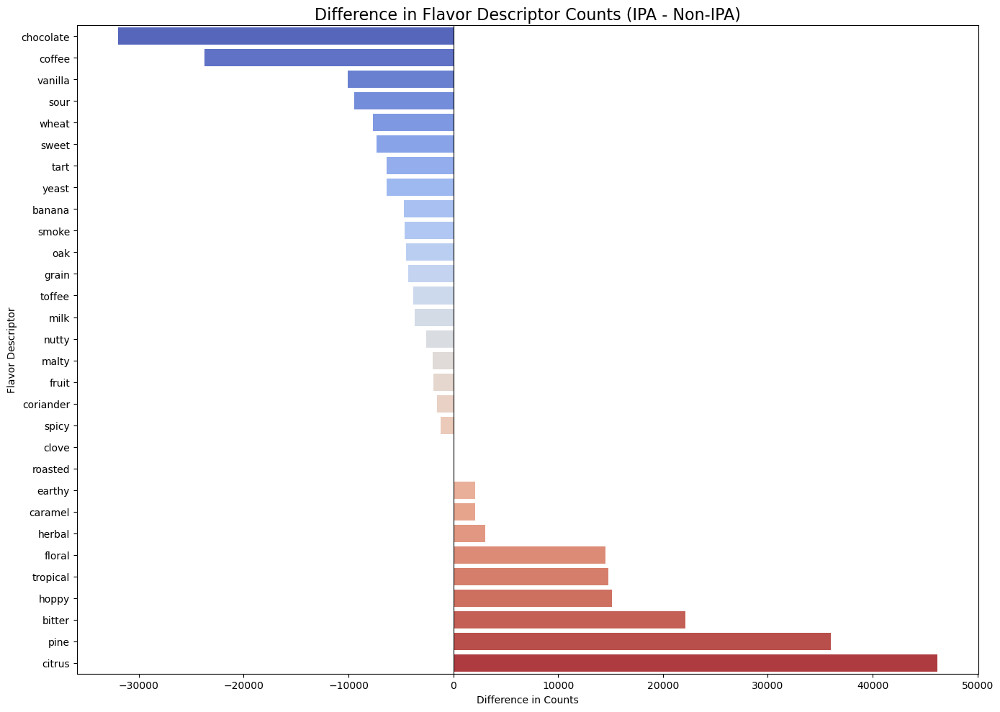

In [ ]:
cluster_reviews_df = ba_reviews_df[ba_reviews_df['style'].isin(macro_group)].copy()
cluster_reviews_df.reset_index(drop=True, inplace=True)
other_reviews_df = ba_reviews_df[~ba_reviews_df['style'].isin(macro_group)].copy()
other_reviews_df.reset_index(drop=True, inplace=True)

#Filter our subsets and balance
_ , flavor_comparison_df = extract_features(cluster_reviews_df, other_reviews_df)

# Sort by absolute difference
sorted_flavors = flavor_comparison_df.sort_values('Difference', ascending=True)

# Plot difference bar chart
plt.figure(figsize=(14, 10))
sns.barplot(
    data=sorted_flavors,
    x='Difference',
    y='Appear',
    palette='coolwarm',
    orient='h'
)
plt.title('Difference in Flavor Descriptor Counts (IPA - Non-IPA)', size=16)
plt.xlabel('Difference in Counts')
plt.ylabel('Flavor Descriptor')
plt.axvline(0, color='black', linewidth=0.8)
plt.tight_layout()
plt.show()


We observe that the flavor scores for both our cluster and the IPA styles are very similar. Additionally, the main styles in Cluster 2 closely align with the broader group of IPA beers. Based on these similarities, we will use Cluster 2 as a proxy for IPA beers.

<h1 style="font-size: 30px;">1.3: ABV / Brewery size / Seasonal distribution</h1>

<span style="color:red">
Beeradvocate is very pleased with our results. To gain deeper insights into each cluster's characteristics, they requested additional analyses focusing on:

1. ABV Differences: Comparing the average alcohol by volume (ABV) across clusters to highlight strength variations.
2. Brewery Sizes: Identifying the typical number of beers brewed by breweries associated with each cluster.
3. Best Seasons: Determining the most popular seasons for each cluster based on review activity, helping to link beer styles to seasonal preferences.

These analyses will provide a more comprehensive understanding of the clusters, enabling more personalized recommendations and community building.</span>

Let's check now the ditribution of the quantity of ABV contained in the beers. This would help us to find the normal quantity of alcool a brewery has to consider while brewing a new beer depending of the cluster.

<h1 style="font-size: 25px;">1.3.1: Data preprossessing</h1>

In [80]:
from src.data.helpers import *

Here we create a dataframe that stores the ratings given by the users. In assigned_cluster, each line of the dataframe corresponds to one beer. Here for assigned_cluster_ratings, each line corresponds to one rating.

In [85]:
# Apply the cleanup function. This function allows us to use the shapefiles later
ba_users_df['cleaned_location'] = ba_users_df['location'].apply(clean_location)

#Take only releavant categories
users_df_selected = ba_users_df[['user_id', 'cleaned_location']]
ratings_df_selected = ba_ratings_df[['user_id', 'beer_id', 'brewery_id', 'style', 'abv', 'appearance', 'aroma', 'palate', 'rating', 'taste', 'date']]

# Merging on 'user_id'
#Contains the ratings and the location of the users
merged_df = pd.merge(users_df_selected, ratings_df_selected, on='user_id', how='right')

#Assign the cluster for each rating (depending on the beer beeing rated)
assigned_cluster_ratings = pd.merge(result_df[['beer_id', 'cluster']], merged_df, on='beer_id', how='right')
#We are interested only in cluster form 0 to 8 (others are outsiders)
assigned_cluster_ratings = assigned_cluster_ratings[assigned_cluster_ratings['cluster'].between(0, 8)]

# Extract the year and month from the datetime
assigned_cluster_ratings['datetime'] = pd.to_datetime(assigned_cluster_ratings['date'], unit='s')
assigned_cluster_ratings['year'] = assigned_cluster_ratings['datetime'].dt.year
assigned_cluster_ratings['month'] = assigned_cluster_ratings['datetime'].dt.month

<h1 style="font-size: 25px;">1.3.2: ABV distribution</h1>

The goal of this analysis is to visualize the distribution of alcohol percentage (ABV) across different beers. We use the assigned_cluster variable to group beers by cluster, allowing us to examine how alcohol content varies within each cluster. This approach highlights potential differences in beer strength across clusters, offering deeper insight into the distinct characteristics of each beer community.

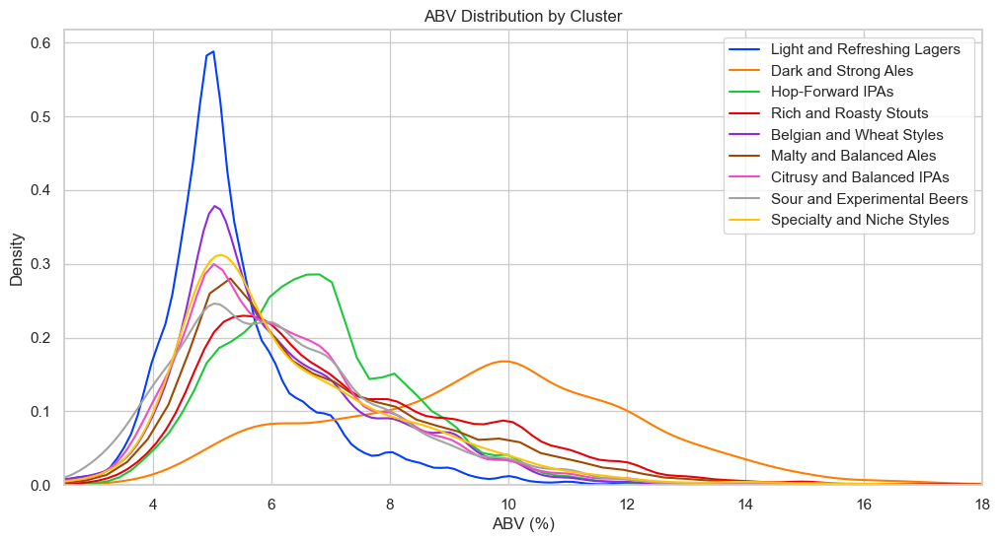

In [44]:
show_distribution(assigned_cluster, 'abv', 'ABV Distribution by Cluster', 'ABV (%)', 2.5, 18)

Beers in the Dark and Strong Ale cluster have the highest alcohol content, reflecting their robust and intense brewing styles. IPA beers follow closely, with most falling between 6% and 7% ABV, consistent with their traditionally bold and hoppy profiles.

The Rich and Roasty Stouts cluster has a slightly lower average ABV, typically ranging between 5% and 6%. However, this cluster exhibits a long-tailed distribution, with a notable number of beers reaching up to 10% ABV. This indicates that while many stouts are moderately strong, there are also specialty and imperial versions with significantly higher alcohol content.

Finally, Light and Refreshing Lagers are positioned at the lower end of the ABV distribution. Over half of the beers in this cluster have an alcohol content close to 5%, reflecting their easy-drinking and sessionable nature. This lower ABV aligns with the typical profile of lagers designed for refreshment and wide appeal.

<h1 style="font-size: 25px;">1.3.3: Seasonal distribution</h1>

To analyze seasonal preferences, we examine the absolute number of ratings per cluster and per month using our assigned_cluster_ratings DataFrame, which includes all recorded ratings. This allows us to track how beer popularity fluctuates across different seasons.

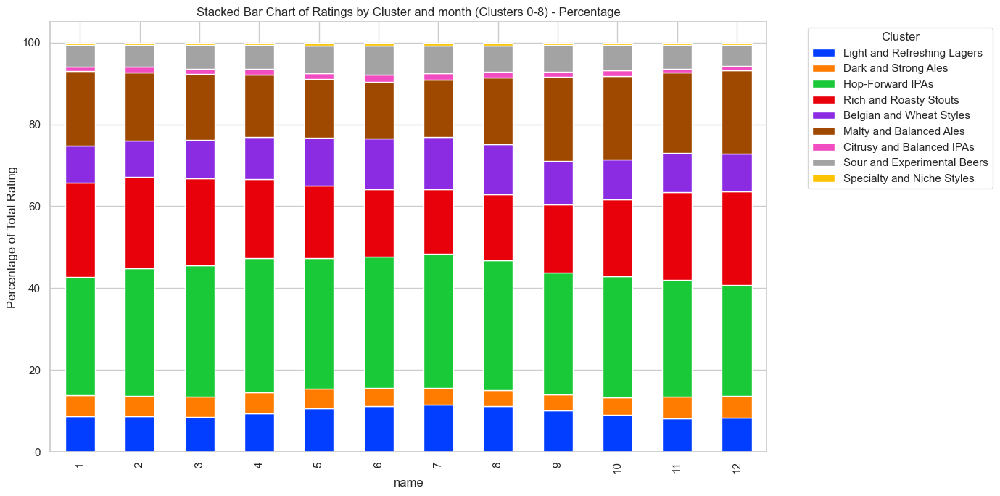

In [83]:
month_cluster = assigned_cluster_ratings.groupby(['month', 'cluster']).count().reset_index()
month_cluster = month_cluster[['month', 'cluster', 'rating']]
show_evolution(month_cluster, "month")

The seasonal distribution observed in the graph aligns perfectly with expected beer-drinking patterns based on typical style characteristics:

1. Light and Refreshing Lagers: These beers peak in summer, reflecting their crisp, thirst-quenching nature, ideal for hot weather.

2. Dark and Strong Ales: A noticeable rise is visible, which makes sense given their warming, high-alcohol profiles suited for cold seasons.

3. Hop-Forward IPAs: IPAs appear to be popular year-round, with a slight spring and summer increase. Their bold, hoppy flavors appeal to craft beer enthusiasts regardless of season but are especially refreshing in warmer months.

4. Rich and Roasty Stouts: A winter and fall clear peak confirms the preference for these robust, comforting beers during colder months.

5. Belgian and Wheat Styles: The graph shows a peak in spring and summer, reflecting their fruity, refreshing qualities, often linked to warmer weather.

6. Malty and Balanced Ales: The fall and winter peaks align with these beers’ malty, smooth character, making them perfect for cooler seasons.

7. Citrusy and Balanced IPAs: A bigger presence in spring and summer highlights the popularity of these bright, citrus-forward IPAs during warmer months. However, since this cluster contains a smaller number of beers, the seasonal trend is less pronounced and harder to observe clearly. 

8. Sour and Experimental Beers: These beers show a clear summer peak, consistent with their tart, refreshing nature that pairs well with hot weather.

9. Specialty and Niche Styles: The graph likely shows more scattered peaks, as these beers can be seasonal or brewed for specific events, varying throughout the year. Again, since this cluster contains a smaller number of beers, any trend would be less pronounced and harder to observe clearly. 

Overall, the graph reflects a logical, seasonally-driven pattern that aligns closely with known beer style preferences. This suggests that the clusters not only capture distinct beer characteristics but also resonate with real-world drinking trends.

We inverstigate here what's the size of the breweries for each style of beers. What should be expected on the market in terms of brewery sizes? For example, if we want to do some counsulting for a really small brewery, brewing only a few 2-3 beers, we would probably recommand them to brew lager, as lagers are brewed by smaller breweries. Brewing "Dark and Strong Ales" might be difficult because it's more likely to be brewed by well known breweries and brands. 

<h1 style="font-size: 25px;">1.3.4: Brewery size distribution</h1>

We aim to identify which cluster is associated with the largest breweries. However, since we do not have direct information on brewery size, we instead present the beer portfolio size for each cluster, which provides an overview of the variety of beers propose by the brewery within each cluster. It's important to note that this is not a proxy, as the number of different beers for each style is not necessarily representative of brewery sizes.

In [46]:
beers_clusters = pd.merge(result_df[['beer_id', 'cluster']], ba_beers_df, on='beer_id', how='right')
ba_breweries_numbers = ba_breweries_df[['id', 'nbr_beers']]
breweries_cluster = pd.merge(beers_clusters, ba_breweries_numbers, left_on='brewery_id', right_on='id', how='left')

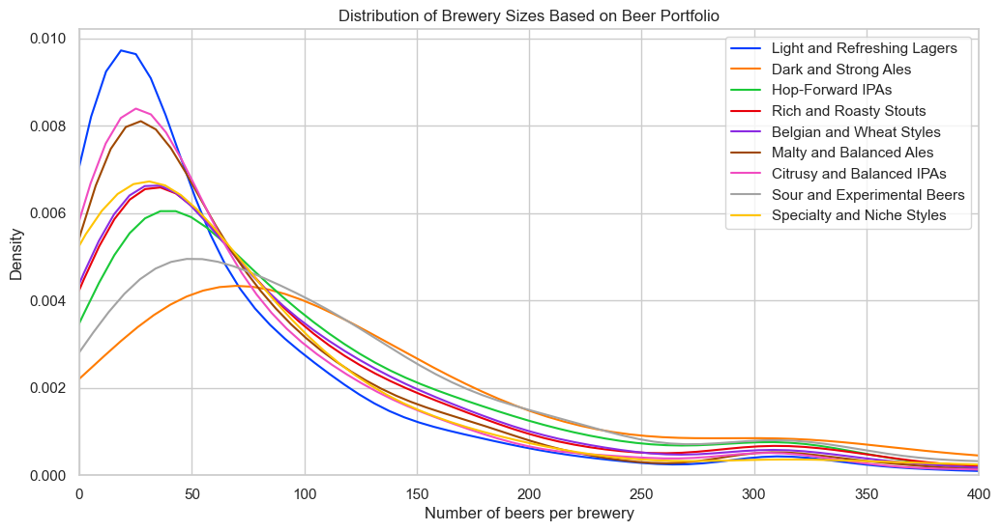

In [49]:
show_distribution(breweries_cluster, 'nbr_beers', 'Distribution of Brewery Sizes Based on Beer Portfolio', 'Number of beers per brewery', 0, 400)

Smaller breweries are more likely to dominate clusters like Light and Refreshing Lagers and Citrusy and Balanced IPAs, which focus on lighter, hop-forward styles. Medium to large breweries are predominant in clusters such as Malty and Balanced Ales, Belgian and Wheat Styles, and Specialty and Niche Styles, which offer a broader range of diverse and experimental beers. The largest breweries are typically found in clusters like Hop-Forward IPAs, Sour and Experimental Beers, and Dark and Strong Ales, where larger-scale production and more diverse offerings are common.

<h1 style="font-size: 30px;">1.4: Average rating</h1>

<span style="color:red">
BeerAdvocate seeks to understand the factors influencing beer ratings and has asked us to compare the ratings given by users across each cluster. Specifically, they want to identify if certain communities tend to rate beers more favorably than others. When a user rates a beer, the goal is to determine how to assess whether their rating is considered high or low in relation to the ratings of others within the same community.
</span>

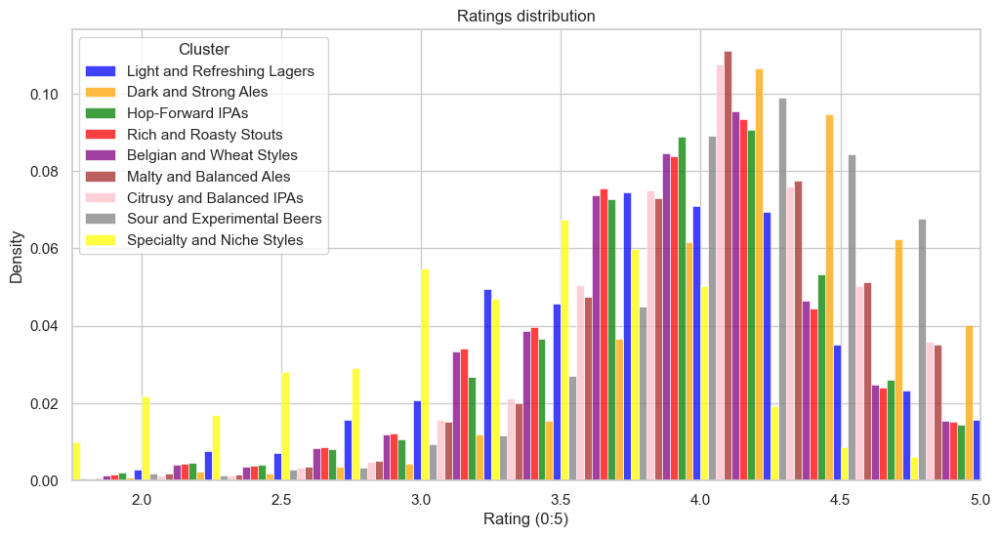

In [77]:
show_distribution_histogram(assigned_cluster_ratings, 'rating', 'Ratings distribution', 'Rating (0:5)', 1.75, 5)

<h1 style="font-size: 30px;">1.5: Temporal evolution</h1>

<span style="color:red">BeerAdvocate also wants to gain insights into the evolution of beer styles over the years. To achieve this, they aim to track how the number of ratings for different beer clusters has changed over time. By analyzing trends in user ratings across various years, BeerAdvocate can better understand shifting tastes and emerging beer styles. This will provide valuable insights into which user communities are growing or shrinking, helping them identify evolving preferences and anticipate future trends.</span>      

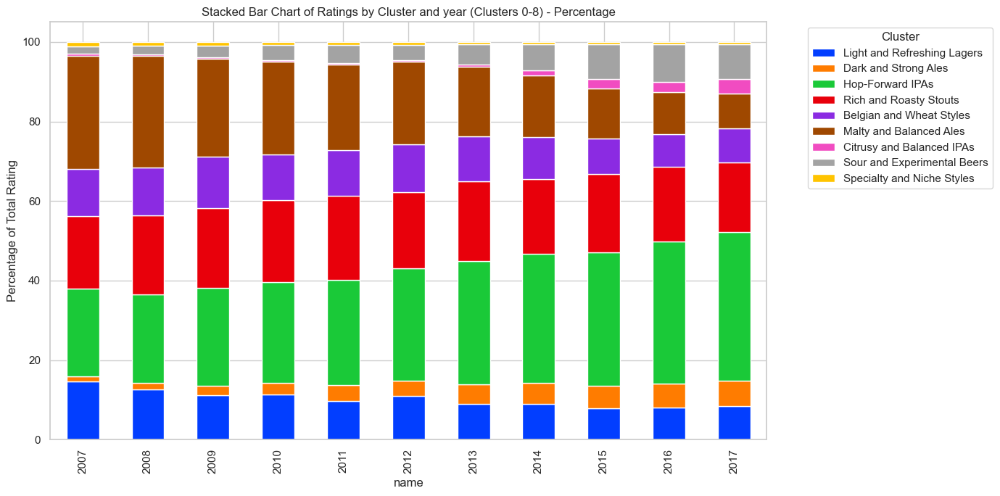

In [87]:
year_cluster = assigned_cluster_ratings.groupby(['year', 'cluster']).count().reset_index()
year_cluster = year_cluster[['year', 'cluster', 'rating']]
year_cluster = year_cluster[year_cluster['year'].between(2007, 2017)]
show_evolution(year_cluster, "year")

The Light and Refreshing Lagers (Cluster 0) and Malty and Balanced Ales (Cluster 5) are becoming less popular over time. Lighter lagers, such as pilsners and pale lagers, while still widely consumed, have seen a decline as craft beer drinkers increasingly seek more flavorful and innovative options. Similarly, malty and balanced ales, like amber ales, have been overshadowed by hop-forward styles and experimental beers that offer bolder flavors. On the other hand, Hop-Forward IPAs (Cluster 2) are gaining significant popularity. IPAs, particularly with intense hop profiles, have driven the craft beer movement, with constant experimentation in styles like New England IPAs and Double IPAs contributing to their growth. Additionally, Specialty and Niche Styles (Cluster 8), including sour ales and barrel-aged beers, are also on the rise as beer drinkers explore more unique and adventurous options. This shift reflects broader trends in the craft beer industry, where bold, innovative beers are gaining traction, while traditional, lighter styles are seeing a relative decline.

<h1 style="font-size: 30px;">1.6: World distribution</h1>

<span style="color:red">
BeerAdvocate has requested an analysis of the geographic distribution of beer clusters to better understand where different beer communities are most prominent. This information would provide valuable insights into regional preferences and brewing cultures. By identifying the locations where specific clusters are highly rated, users could discover where people with similar tastes are concentrated, helping them connect with like-minded beer enthusiasts.

For example, a fan of Hop-Forward IPAs might be interested in knowing which regions have a strong IPA-loving community or where other IPA enthusiasts are located.</span>      

To do so we selected the set of countries where at least 1000 beer ratings have been made.

In [169]:
#Here is the data preprossing for this part.
top_locations = filter_location(1000, assigned_cluster_ratings)
country_cluster = top_locations.groupby(['cleaned_location', 'cluster']).count().reset_index()
country_cluster = country_cluster[['cleaned_location', 'cluster', 'rating']]
country_cluster['cleaned_location_short'] = country_cluster['cleaned_location'].str.slice(0, 9)

For each country, we then show the distribution of the different clusters. For example, for Australia, 20% of the rated beers have been done for cluster 0 - Light and Refreshing Lager.

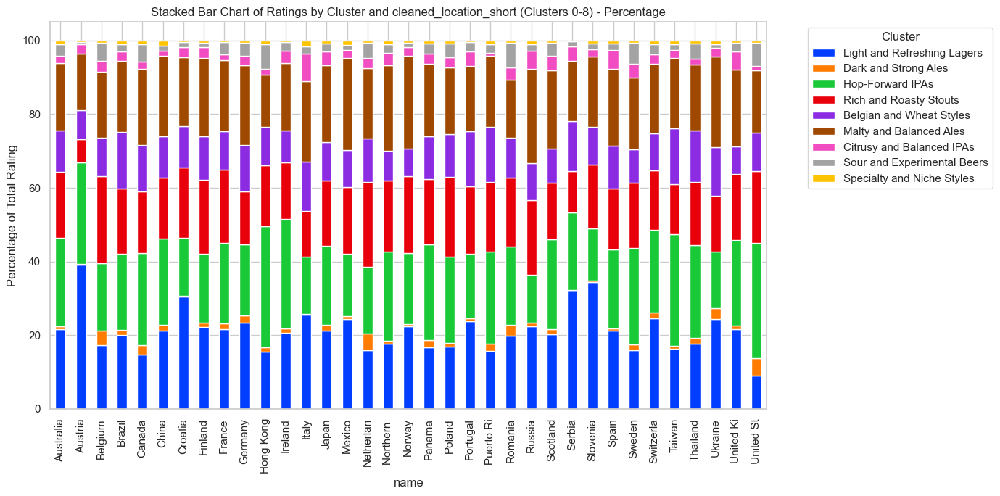

In [170]:
show_evolution(country_cluster, "cleaned_location_short")

We see here different things. First of all, lagers are more popular in country like Austria, Slovenia and Serbia and more generally in central europe. Stronger and darker beers are more popular in the US as well as in Belgium and in the Netherlands. MORE TO WRITE

In [98]:
country_cluster['total_location_ratings'] = country_cluster.groupby('cleaned_location')['rating'].transform('sum')
# Now compute the rating percentage for each location
country_cluster['rating_percentage'] = (country_cluster['rating'] / country_cluster['total_location_ratings']) * 100

In [167]:
cluster_mapping = {
    0: 'Light and Refreshing Lagers',
    1: 'Dark and Strong Ales',
    2: 'Hop-Forward IPAs',
    3: 'Rich and Roasty Stouts',
    4: 'Belgian and Wheat Styles',
    5: 'Malty and Balanced Ales',
    6: 'Citrusy and Balanced IPAs',
    7: 'Sour and Experimental Beers',
    8: 'Specialty and Niche Styles'
}

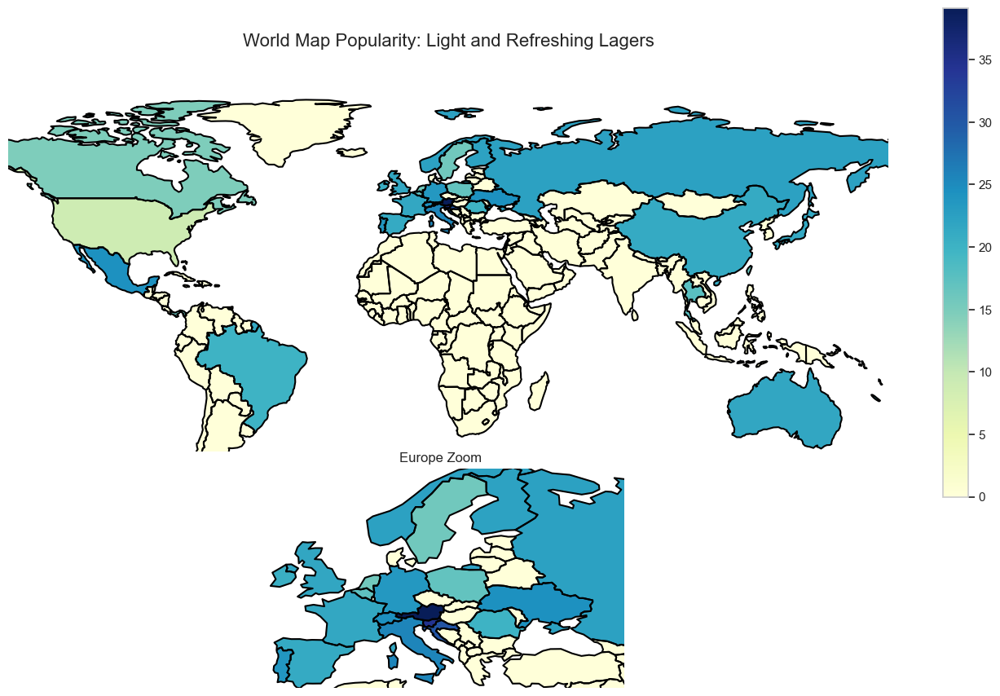

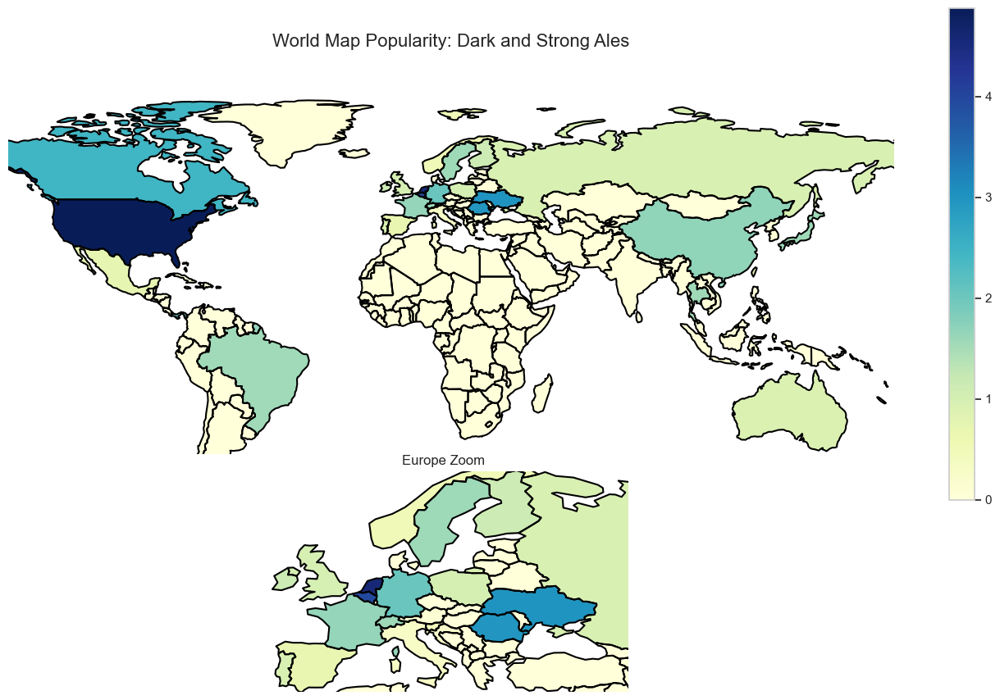

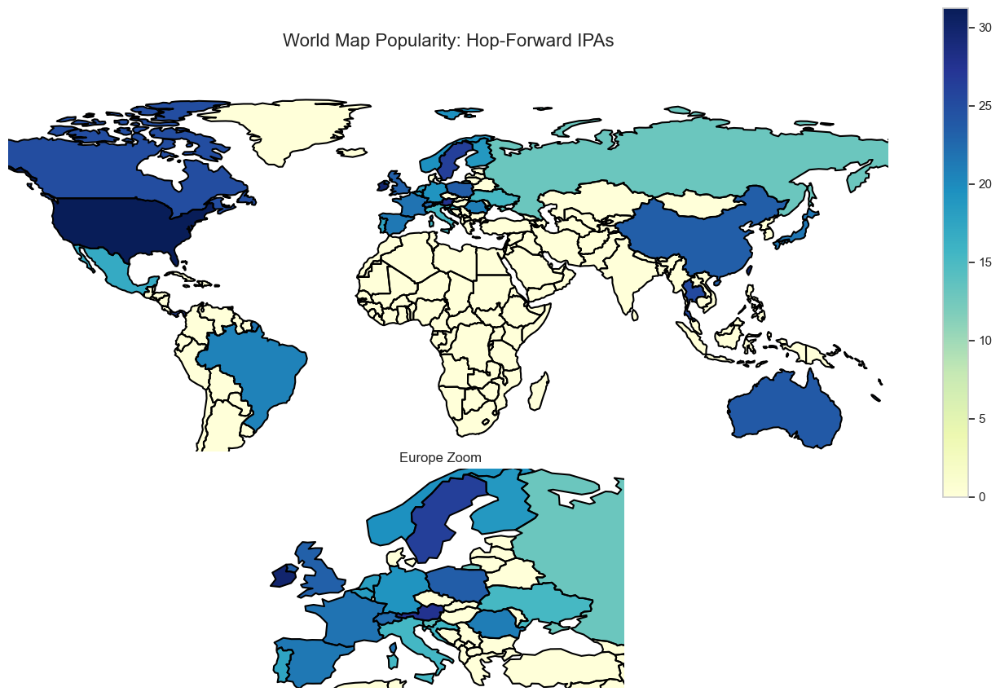

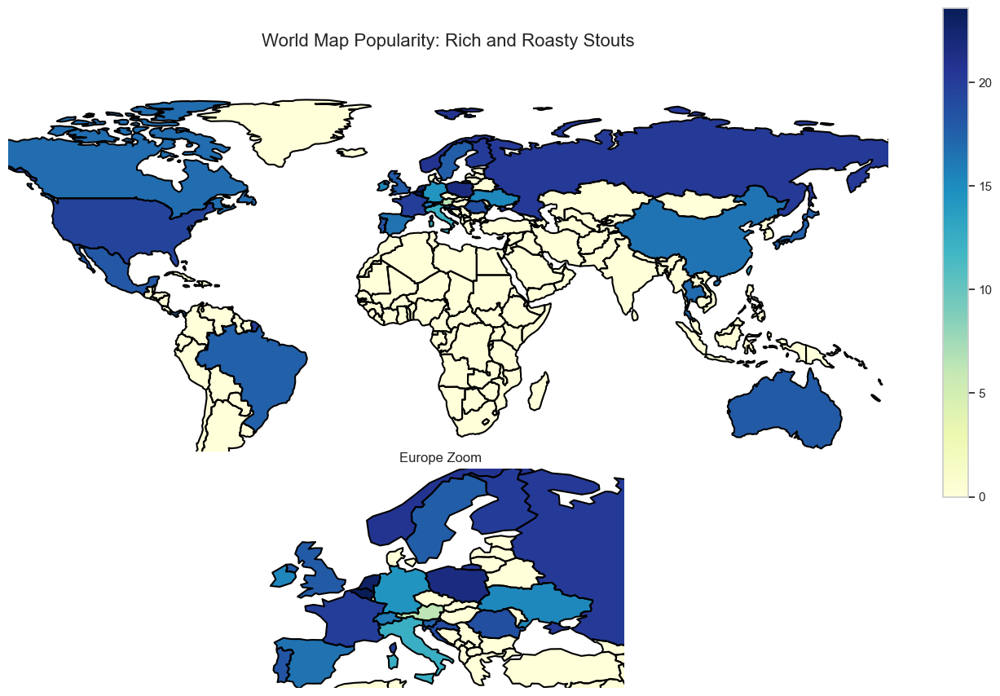

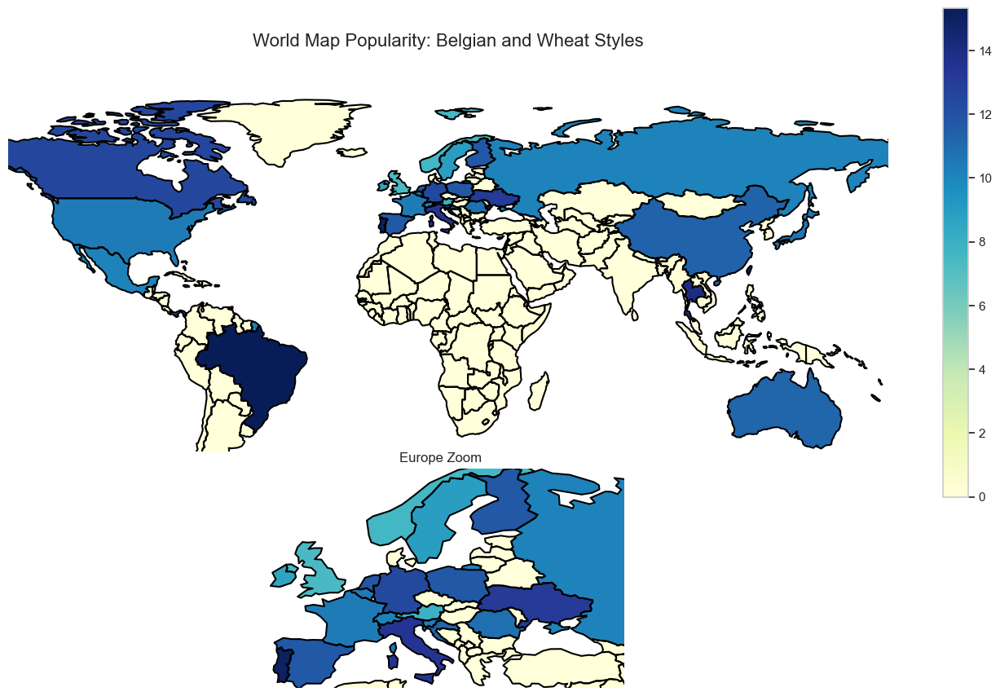

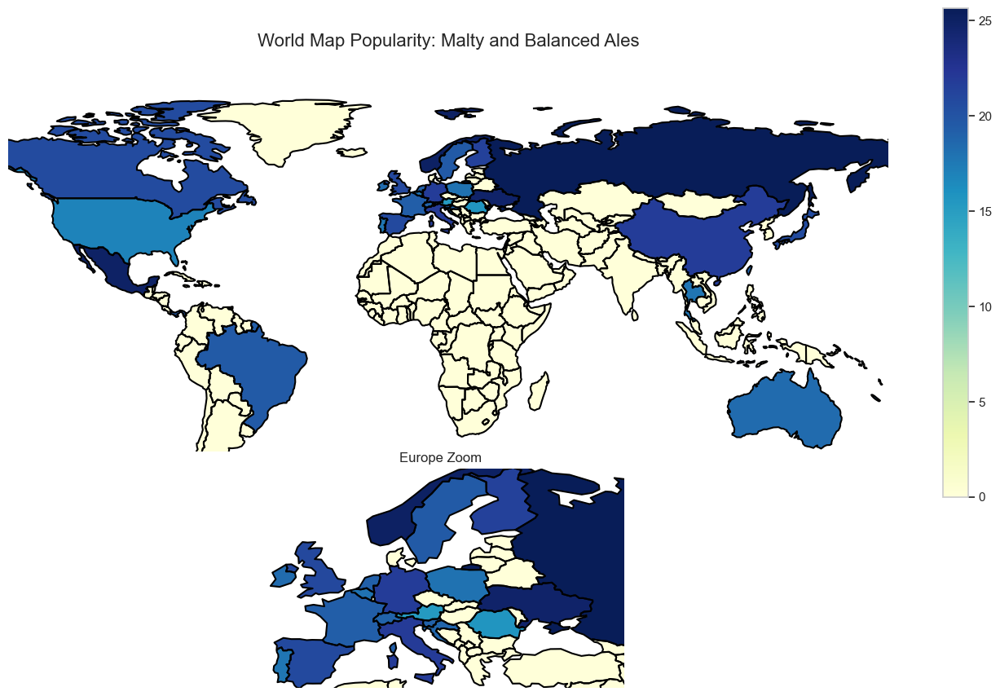

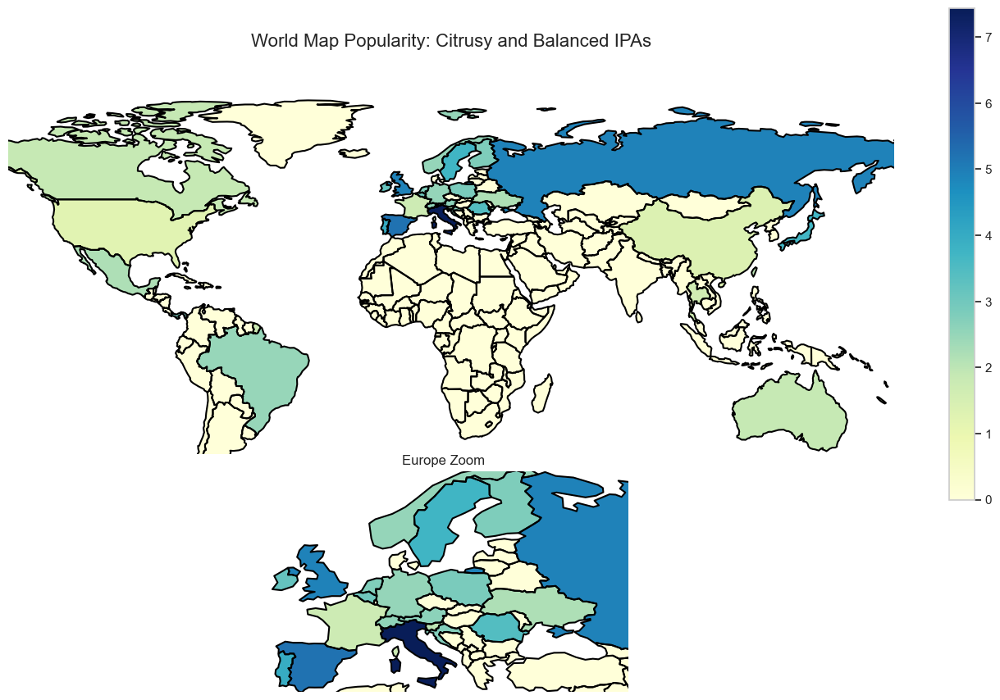

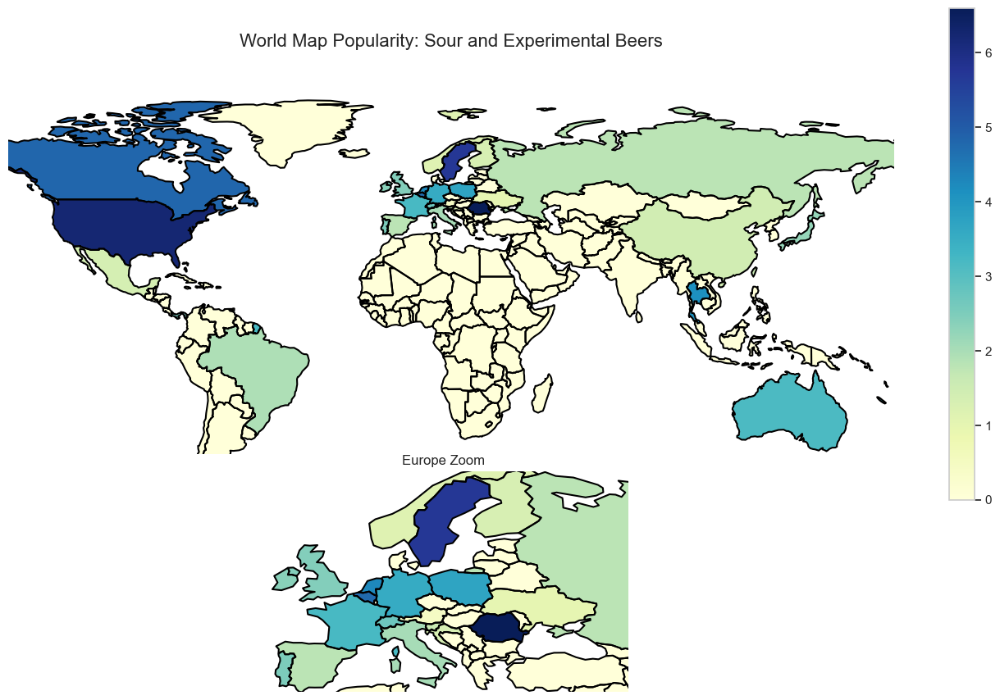

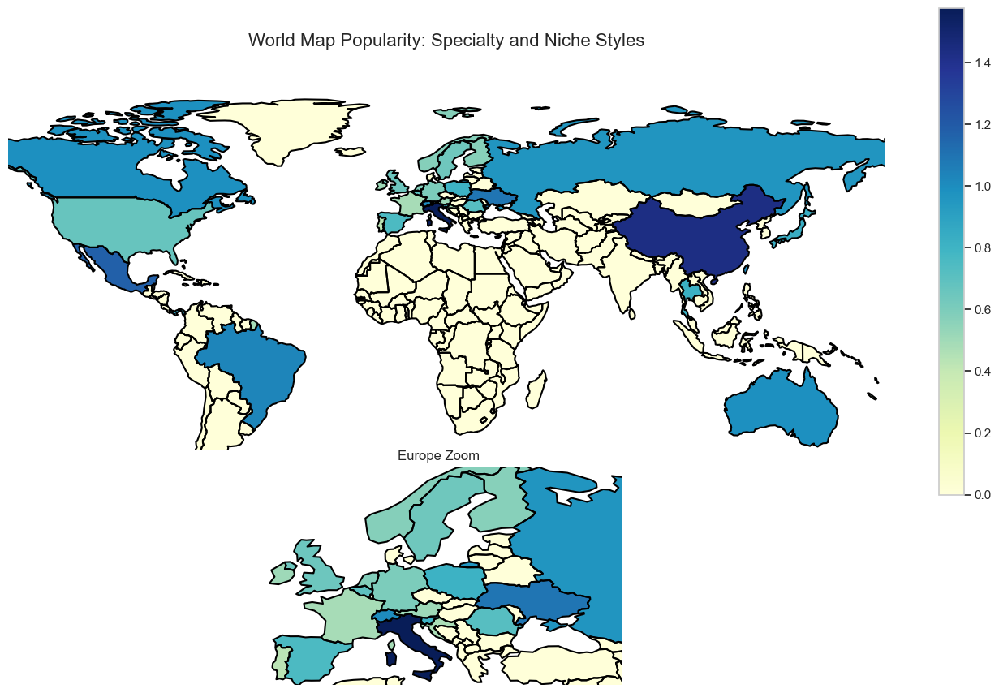

In [168]:
for i in range(0, 9):
    geographic_distribution_cluster(i, cluster_mapping[i], country_cluster)